The objective of this project is to examine the quality of the attached dataset, use machine learning (ML) techniques to uncover insights, hidden patterns, and forecast trends. The focus areas include financial and risk forecasting, as well as identifying the ideal customer profile (ICP).

#### Install Libraries

In [39]:
!pip install autoviz
!pip install pandas-profiling
!pip install sweetviz
!pip install lazypredict

### Import

In [40]:
import math
import lazypredict
import pandas as pd
import seaborn as sns
import sweetviz as sv
from autoviz import FixDQ
from tabulate import tabulate
import matplotlib.pyplot as plt
from autoviz import AutoViz_Class
from ydata_profiling import ProfileReport
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from autoviz import data_cleaning_suggestions
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, average_precision_score
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from lazypredict.Supervised import LazyClassifier
%matplotlib inline

random_state=42

# Understanding Data

### Read the csv file

In [71]:
# Read the csv file
df=pd.read_csv("/content/drive/MyDrive/forseAI/insurance_data_sample.csv")

In [72]:
#First 10 rows of the dataframe
df.head(10)

,Car_id,Date,Customer Name,Gender,Annual Income,Dealer_Name,Company,Model,Engine,Transmission,Color,Price ($),Dealer_No,Body Style,Phone,Amount_paid_for_insurance,Claim amount,City
0,C_CND_000001,01/02/2022,Geraldine,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Auto,Black,26000,06457-3834,SUV,8264678,1665,0.00,Riga
1,C_CND_000002,01/02/2022,Gia,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Auto,Black,19000,60504-7114,SUV,6848189,1332,1900.00,Liepaja
2,C_CND_000003,01/02/2022,Gianna,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Manual,Red,31500,38701-8047,Passenger,7298798,1897,0.00,Riga
3,C_CND_000004,01/02/2022,Giselle,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Manual,Pale White,14000,99301-3882,SUV,6257557,1176,0.00,Jelgava
4,C_CND_000005,01/02/2022,Grace,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Auto,Red,24500,53546-9427,Hatchback,7081483,1323,2450.00,Liepaja
5,C_CND_000006,01/02/2022,Guadalupe,Male,850000,Classic Chevy,Mitsubishi,Diamante,Overhead Camshaft,Manual,Pale White,12000,85257-3102,Hatchback,7315216,830,0.00,Riga
6,C_CND_000007,01/02/2022,Hailey,Male,1600000,Clay Johnson Auto Sales,Toyota,Corolla,Overhead Camshaft,Manual,Pale White,14000,78758-7841,Passenger,7727879,717,0.00,Riga
7,C_CND_000008,01/02/2022,Graham,Male,13500,U-Haul CO,Mitsubishi,Galant,DoubleÃ‚Â Overhead Camshaft,Auto,Pale White,42000,78758-7841,Passenger,6206512,2183,0.00,Jelgava
8,C_CND_000009,01/02/2022,Naomi,Male,815000,Rabun Used Car Sales,Chevrolet,Malibu,Overhead Camshaft,Manual,Pale White,82000,85257-3102,Hardtop,7194857,4206,0.00,Ventspils
9,C_CND_000010,01/02/2022,Grayson,Female,13500,Rabun Used Car Sales,Ford,Escort,DoubleÃ‚Â Overhead Camshaft,Auto,Pale White,15000,85257-3102,Passenger,7836892,873,0.00,Ventspils


In [73]:
# Clean up column names
df.columns = df.columns.str.strip().str.replace(' ', '_')
print(df.columns)

Index(['Car_id', 'Date', 'Customer_Name', 'Gender', 'Annual_Income',
       'Dealer_Name', 'Company', 'Model', 'Engine', 'Transmission', 'Color',
       'Price_($)', 'Dealer_No', 'Body_Style', 'Phone',
       'Amount_paid_for_insurance', 'Claim_amount', 'City'],
      dtype='object')


In [74]:
# List of explanations for each column
col_explanations = [
    "Unique identifier for each car.",
    "Date of the transaction.",
    "Name of the customer.",
    "Gender of the customer.",
    "Annual income of the customer.",
    "Name of the car dealer.",
    "Brand of the car.",
    "Model of the car.",
    "Type of engine in the car.",
    "Type of transmission in the car.",
    "Color of the car.",
    "Price of the car in dollars.",
    "Dealer number.",
    "Body style of the car.",
    "Phone number of the customer.",
    "Amount paid for car insurance.",
    "Amount claimed in insurance.",
    "City where the transaction took place."
]

# Creating a DataFrame from the column explanations
col_explanation_df = pd.DataFrame({
    'Variables': ['Car_id', 'Date', 'Customer_Name', 'Gender', 'Annual_Income', 'Dealer_Name',
                  'Company', 'Model', 'Engine', 'Transmission', 'Color', 'Price_($)',
                  'Dealer_No', 'Body_Style', 'Phone', 'Amount_paid_for_insurance',
                  'Claim_amount', 'City'],
    'Explanation': col_explanations
})

# Applying a background gradient to the DataFrame for better visualization
col_explanation_df.style.background_gradient()

,Variables,Explanation
0,Car_id,Unique identifier for each car.
1,Date,Date of the transaction.
2,Customer_Name,Name of the customer.
3,Gender,Gender of the customer.
4,Annual_Income,Annual income of the customer.
5,Dealer_Name,Name of the car dealer.
6,Company,Brand of the car.
7,Model,Model of the car.
8,Engine,Type of engine in the car.
9,Transmission,Type of transmission in the car.


In [75]:
#First 10 rows of the dataframe
df.head()

,Car_id,Date,Customer_Name,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Transmission,Color,Price_($),Dealer_No,Body_Style,Phone,Amount_paid_for_insurance,Claim_amount,City
0,C_CND_000001,01/02/2022,Geraldine,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Auto,Black,26000,06457-3834,SUV,8264678,1665,0.00,Riga
1,C_CND_000002,01/02/2022,Gia,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Auto,Black,19000,60504-7114,SUV,6848189,1332,1900.00,Liepaja
2,C_CND_000003,01/02/2022,Gianna,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Manual,Red,31500,38701-8047,Passenger,7298798,1897,0.00,Riga
3,C_CND_000004,01/02/2022,Giselle,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Manual,Pale White,14000,99301-3882,SUV,6257557,1176,0.00,Jelgava
4,C_CND_000005,01/02/2022,Grace,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Auto,Red,24500,53546-9427,Hatchback,7081483,1323,2450.00,Liepaja


### Statistical Analysis

In [76]:
def print_tabulated_data(data_frame):
    # Print tabulated data from a DataFrame.

    print(tabulate(data_frame, headers='keys', tablefmt='psql'))


def explore_dataframe(df):

    # Perform basic exploratory data analysis on the input DataFrame.

    # Print DataFrame shape
    print("-----------------------------------Shape Of Data-------------------------------------")
    df_shape = df.shape
    print(df_shape)
    print("\n")

    # Print top 5 records
    print("-----------------------------------Top 5 Records-------------------------------------")
    print_tabulated_data(df.head(5))
    print("\n")

    # Print DataFrame information
    print("-----------------------------------Info----------------------------------------------")
    df_info = df.info()
    print_tabulated_data(df_info)
    print("\n")

    # Print DataFrame description
    print("-----------------------------------Describe-------------------------------------------")
    df_describe = df.describe()
    print_tabulated_data(df_describe)
    print("\n")

    # Print column names
    print("-----------------------------------Columns-------------------------------------------")
    df_columns = df.columns
    print(df_columns)
    print("\n")

    # Print data types
    print("-----------------------------------Data Types-----------------------------------------")
    df_dtypes = df.dtypes
    print(df_dtypes)
    print("\n")

    # Print missing values
    print("-----------------------------------Missing Values-------------------------------------")
    df_missing_values = df.isnull().sum()
    print(df_missing_values)
    print("\n")

    # Print NULL values§
    print("-----------------------------------Null values----------------------------------------")
    df_null_values = df.isna().sum()
    print(df_null_values)
    print("\n")

    # Print Dublicate Row if exists
    print("-----------------------------------Dublicate Rows----------------------------------------")
    duplicate_rows = df[df.duplicated()]
    print(duplicate_rows)
    print("\n")

In [77]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 18)


-----------------------------------Top 5 Records-------------------------------------
+----+--------------+------------+-----------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+----------------+------------+-------------+-------------+--------------+---------+-----------------------------+----------------+---------+
|    | Car_id       | Date       | Customer_Name   | Gender   |   Annual_Income | Dealer_Name                         | Company   | Model      | Engine                      | Transmission   | Color      |   Price_($) | Dealer_No   | Body_Style   |   Phone |   Amount_paid_for_insurance |   Claim_amount | City    |
|----+--------------+------------+-----------------+----------+-----------------+-----------------

In [78]:
def missing_values(df, color='black', edgecolor='black', height=3, width=15):
    # Plots the percentage of missing values in each column of the DataFrame.
    plt.figure(figsize=(width, height))

    # Calculate percentage of missing values in each column
    missing_percentage = (df.isnull().mean()) * 100

    # Plot bars for each column with missing values
    missing_percentage.plot.bar(color=color, edgecolor=edgecolor)

    # Add a horizontal line at y=0 to highlight the threshold
    plt.axhline(y=0, color='r', linestyle='-')

    # Title and labels
    plt.title('Missing Values Percentage per Column', fontsize=20, weight='bold')
    plt.xlabel('Columns', size=15, weight='bold')
    plt.ylabel('Missing Values Percentage', size=15, weight='bold')

    # Customize ticks
    plt.yticks(weight='bold')

    return plt.show()

def plot_value_counts(df, column, xlabel_rotation=90, figsize=(10, 6), palette='viridis'):
    # Creates a bar plot of the value counts for a specified column, including percentage annotations.
    # Get the value counts for the specified column
    column_counts = df[column].value_counts()
    total_count = len(df)

    # Calculate percentages
    percentages = (column_counts / total_count) * 100

    # Create a DataFrame for plotting
    plot_data = pd.DataFrame({
        column: column_counts.index,
        'Counts': column_counts.values,
        'Percentage': percentages
    })

    # Plot the histogram
    plt.figure(figsize=figsize)
    ax = sns.barplot(x=column_counts.index, y=column_counts.values, palette=palette)
    plt.xticks(rotation=xlabel_rotation)
    plt.xlabel(column)
    plt.ylabel('Counts')
    plt.title(f'Histogram of {column} Value Counts')

    # Add percentage annotations
    for p in ax.patches:
        percentage = 100 * p.get_height() / total_count
        ax.annotate(f'{percentage:.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

    plt.show()

def plot_value_counts(df, column):
    # Plots the top 20 value counts for a specified column as a bar chart.
    # Get the top 20 values
    top_values = df[column].value_counts().head(20)

    # Plot the bar chart
    plt.figure(figsize=(10, 6))
    top_values.plot(kind='bar', color='green')
    plt.title(f'Top 20 {column} Values')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

def plot_relationship_with_city(feature):
    # Plots the distribution of a feature by city using a count plot.
    plt.figure(figsize=(12, 8))
    sns.countplot(data=df, x=feature, hue='City', palette='viridis')
    plt.title(f'{feature} Distribution by City')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='City', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

def detect_outliers_boxplot(data, column, vert=False):
    # Uses a boxplot to detect outliers in a specified column.
    plt.boxplot(data[column], vert=vert)
    plt.title("Detecting outliers using Boxplot")
    plt.xlabel(column)
    plt.show()

def plot_numerical_distributions(df, num_list):
    # Plots the distributions of specified numerical columns using histograms.
    colors = sns.color_palette('husl', len(num_list))

    # Set up the figure and title
    plt.figure(figsize=(12, 12))
    plt.tight_layout(pad=3.0)
    plt.suptitle("Distribution of Numerical Values", fontsize=16)

    # Iterate over the numerical columns and create subplots
    for idx, (col, color) in enumerate(zip(num_list, colors), start=1):
        plt.subplot(2, 2, idx)
        sns.histplot(df[col], kde=True, color=color)
        plt.title(col, fontsize=14)
        plt.xlabel('')
        plt.ylabel('')

    # Display the plots
    plt.show()

def cap_outliers(series, lower_percentile=0.01, upper_percentile=0.99):
    # Caps the outliers in a series at the specified lower and upper percentiles.
    lower_bound = series.quantile(lower_percentile)
    upper_bound = series.quantile(upper_percentile)
    return series.clip(lower_bound, upper_bound)

def plot_pie_distribution(df, groupby_column, value_column, title):
    # Plots a pie chart distribution of the sum of values grouped by a specified column.
    plt.figure(figsize=(10,10))

    # Grouping the data by the specified column and summing the specified value column
    grouped_data = df.groupby(groupby_column)[value_column].sum()

    labels = grouped_data.index
    sizes = (grouped_data / grouped_data.sum()) * 100

    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=200)
    plt.title(title, fontsize=15)
    plt.show()

def plot_pie_distribution_percentage(df, groupby_column, value_column, title):
    # Plots a pie chart distribution of the top 20 sums of values grouped by a specified column.
    plt.figure(figsize=(10,10))

    # Grouping the data by the specified column and summing the specified value column
    grouped_data = df.groupby(groupby_column)[value_column].sum()

    # Selecting the top 20 values
    top_values = grouped_data.nlargest(20)
    labels = top_values.index
    sizes = (top_values / top_values.sum()) * 100

    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=200)
    plt.title(title, fontsize=15)
    plt.show()

def setup_plot(figsize=(14, 7)):
    # Sets up the plot with the specified figure size.
    plt.figure(figsize=figsize)

def plot_data(df, x_column, y_column, line_style='-', marker=None, color='b'):
    # Plots the data using a line plot.
    sns.lineplot(x=x_column, y=y_column, data=df, linestyle=line_style, marker=marker, color=color)

def customize_plot(x_column, y_column, title):
    # Customizes the plot with titles, labels, and grid.
    plt.title(title, fontsize=18, weight='bold')
    plt.xlabel(x_column.replace('_', ' ').capitalize(), fontsize=14)
    plt.ylabel(y_column.replace('_', ' ').capitalize(), fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

def finalize_and_show_plot():
    # Finalizes the plot layout and displays it.
    plt.tight_layout()
    plt.show()

def plot_time_series(df, x_column, y_column, title, line_style='-', marker=None, color='b'):
    # Plots a time series with customization.
    setup_plot(figsize=(14, 7))
    plot_data(df, x_column, y_column, line_style=line_style, marker=marker, color=color)
    customize_plot(x_column, y_column, title)
    finalize_and_show_plot()

def drop_column(df, column_name):
    # Drops a specified column from the DataFrame.
    return df.drop(columns=[column_name])

def plot_gender_distribution(df):
    # Plots the gender distribution using a pie chart and count plot.
    f, ax = plt.subplots(1, 2, figsize=(18, 8))

    # Pie chart
    df['Gender'].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.1f%%', ax=ax[0], shadow=True)
    ax[0].set_title('Gender')
    ax[0].set_ylabel('')

    # Count plot
    sns.countplot(x='Gender', data=df, ax=ax[1])
    ax[1].set_title('Gender')

    plt.show()

def label_encode_column(df, column_name):
    # Performs label encoding on the specified column of a DataFrame.
    label_encoder = LabelEncoder()
    df[column_name] = label_encoder.fit_transform(df[column_name])
    return df

def setup_plot(figsize=(14, 7)):
    # Sets up the plot with the specified figure size.
    plt.figure(figsize=figsize)

def plot_data(df, x_column, y_column, line_style='-', marker=None, color='b'):
    # Plots the data using a line plot.
    sns.lineplot(x=x_column, y=y_column, data=df, linestyle=line_style, marker=marker, color=color)

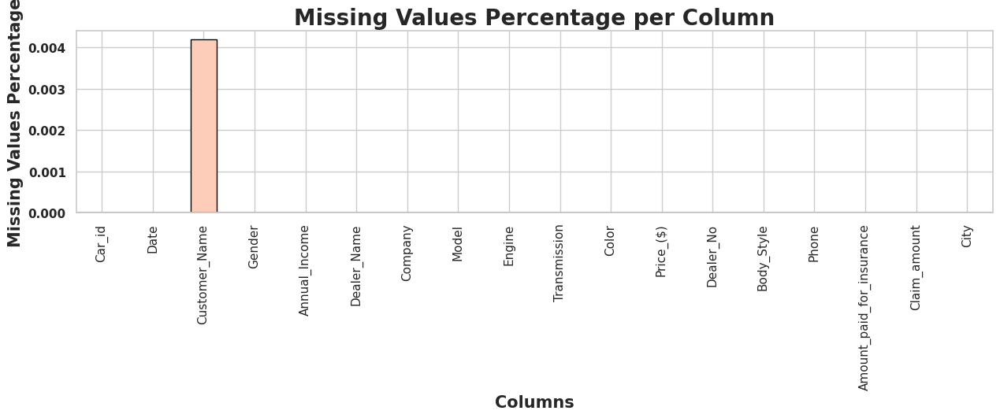

In [79]:
missing_values(df, color=sns.color_palette('Reds', 15))

#### Imputing the customer Name

In [80]:
# Impute missing values in the 'Customer Name' column with the string 'Missing'
df['Customer_Name'] = df['Customer_Name'].fillna('Missing')

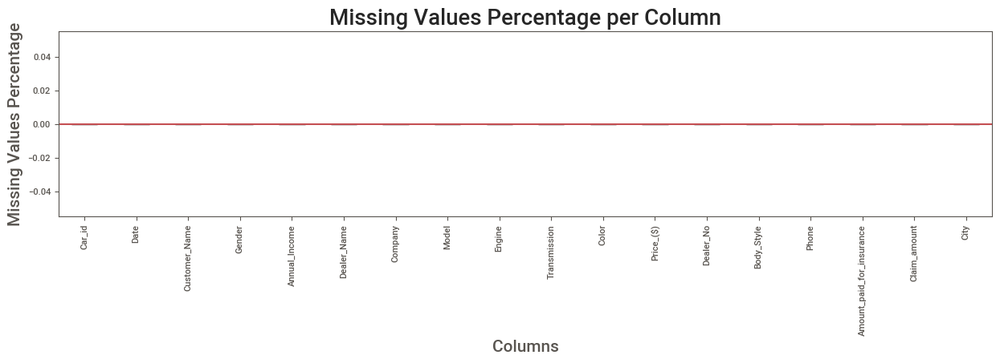

In [51]:
missing_values(df, color=sns.color_palette('Reds', 15))

#### converting date from object to datetime.

In [81]:
# Convert Date column to datetime
df['Date'] = pd.to_datetime(df['Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23906 entries, 0 to 23905
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Car_id                     23906 non-null  object        
 1   Date                       23906 non-null  datetime64[ns]
 2   Customer_Name              23906 non-null  object        
 3   Gender                     23906 non-null  object        
 4   Annual_Income              23906 non-null  int64         
 5   Dealer_Name                23906 non-null  object        
 6   Company                    23906 non-null  object        
 7   Model                      23906 non-null  object        
 8   Engine                     23906 non-null  object        
 9   Transmission               23906 non-null  object        
 10  Color                      23906 non-null  object        
 11  Price_($)                  23906 non-null  int64         
 12  Deal

In [82]:
# Extract year, month, and day from the Date column
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

In [54]:
df.head()

,Car_id,Date,Customer_Name,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Transmission,Color,Price_($),Dealer_No,Body_Style,Phone,Amount_paid_for_insurance,Claim_amount,City,Year,Month,Day
0,C_CND_000001,2022-01-02,Geraldine,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Auto,Black,26000,06457-3834,SUV,8264678,1665,0.00,Riga,2022,1,2
1,C_CND_000002,2022-01-02,Gia,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Auto,Black,19000,60504-7114,SUV,6848189,1332,1900.00,Liepaja,2022,1,2
2,C_CND_000003,2022-01-02,Gianna,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Manual,Red,31500,38701-8047,Passenger,7298798,1897,0.00,Riga,2022,1,2
3,C_CND_000004,2022-01-02,Giselle,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Manual,Pale White,14000,99301-3882,SUV,6257557,1176,0.00,Jelgava,2022,1,2
4,C_CND_000005,2022-01-02,Grace,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Auto,Red,24500,53546-9427,Hatchback,7081483,1323,2450.00,Liepaja,2022,1,2


#### Imputing the customer Name

In [83]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 21)


-----------------------------------Top 5 Records-------------------------------------
+----+--------------+---------------------+-----------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+----------------+------------+-------------+-------------+--------------+---------+-----------------------------+----------------+---------+--------+---------+-------+
|    | Car_id       | Date                | Customer_Name   | Gender   |   Annual_Income | Dealer_Name                         | Company   | Model      | Engine                      | Transmission   | Color      |   Price_($) | Dealer_No   | Body_Style   |   Phone |   Amount_paid_for_insurance |   Claim_amount | City    |   Year |   Month |   Day |
|----+--------------+-----

# Exploratory Data Analysis

In [84]:
df['Gender'].value_counts ()

Gender
Male      18798
Female     5108
Name: count, dtype: int64

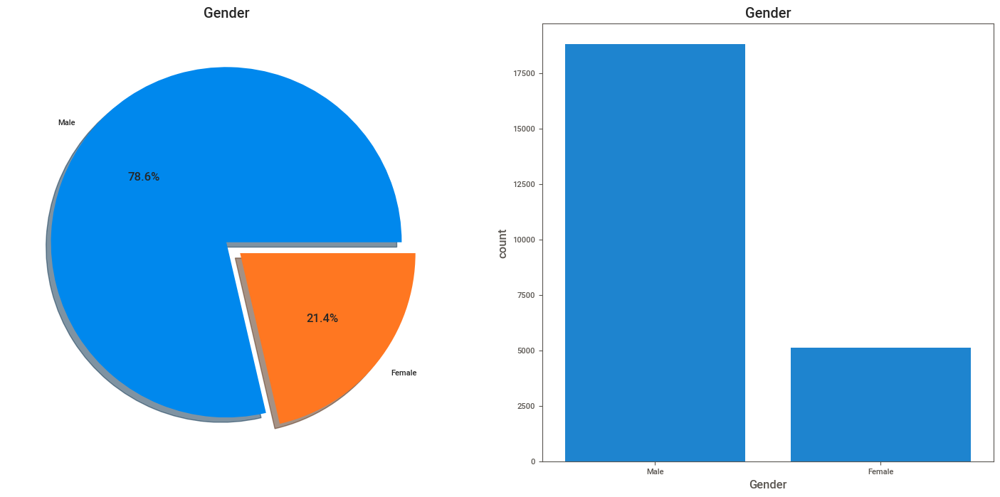

In [57]:
plot_gender_distribution(df)

### Using Pandas Profiling

In [58]:
design_report = ProfileReport(df)
design_report.to_notebook_iframe()
design_report.to_file(output_file='ReportPandasProfiling.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

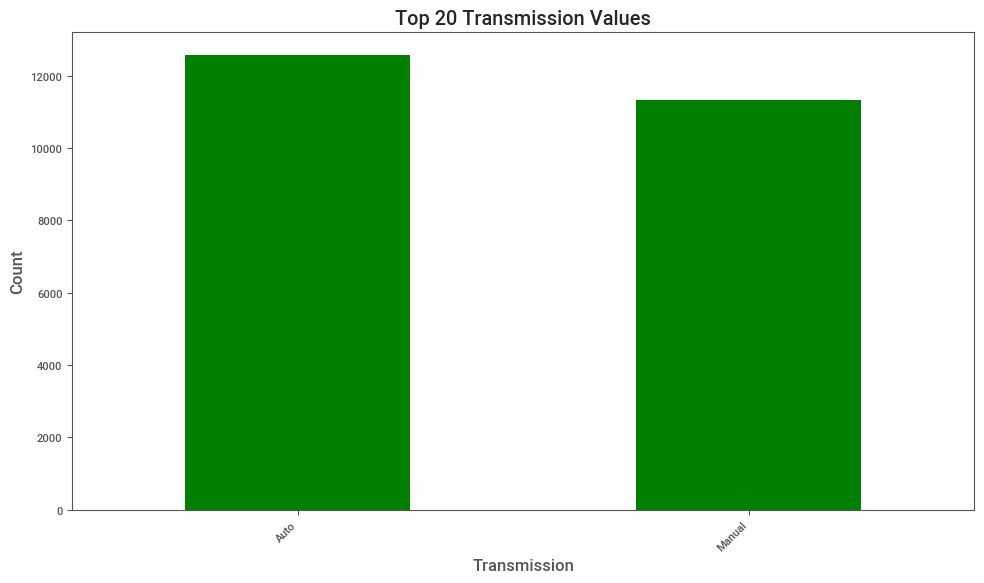

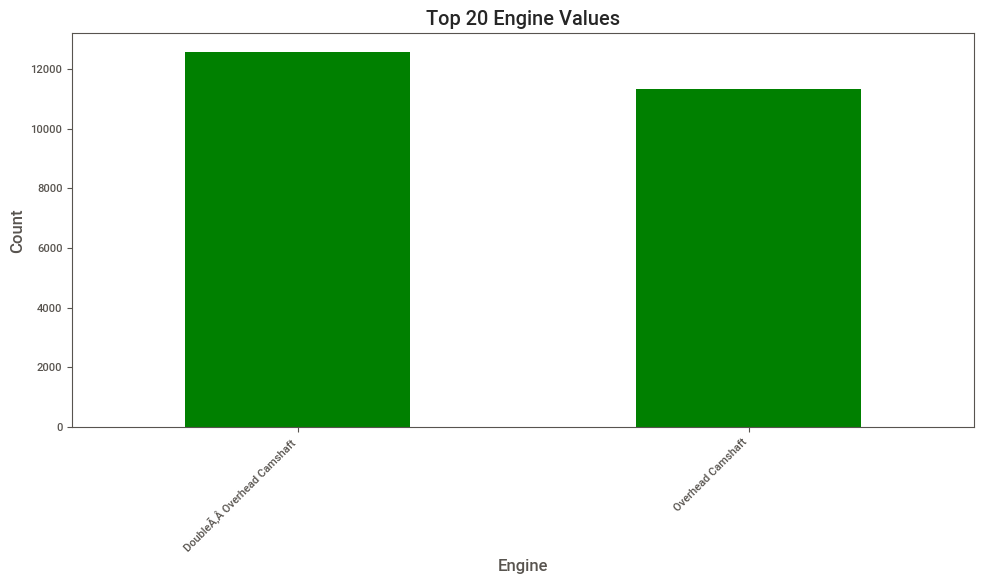

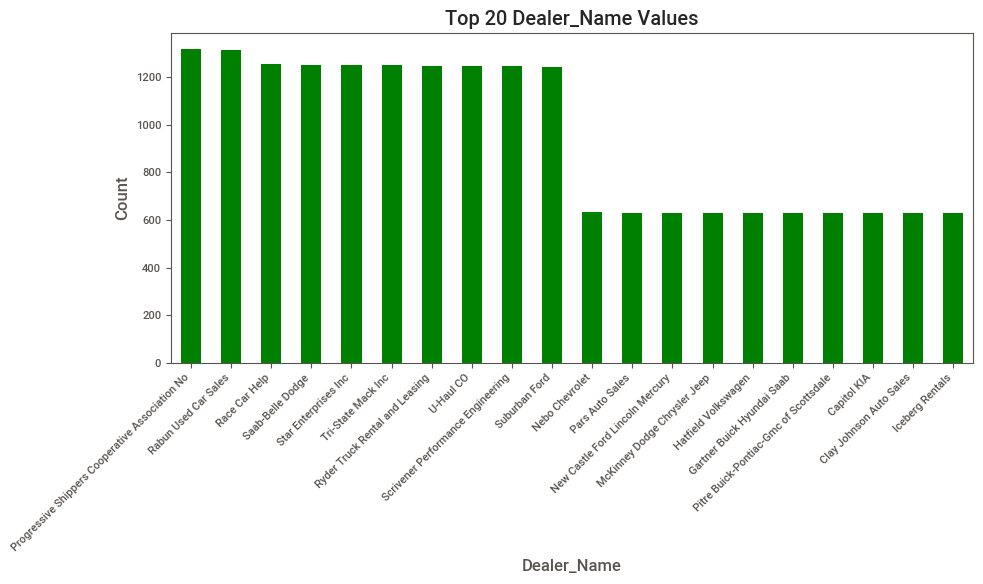

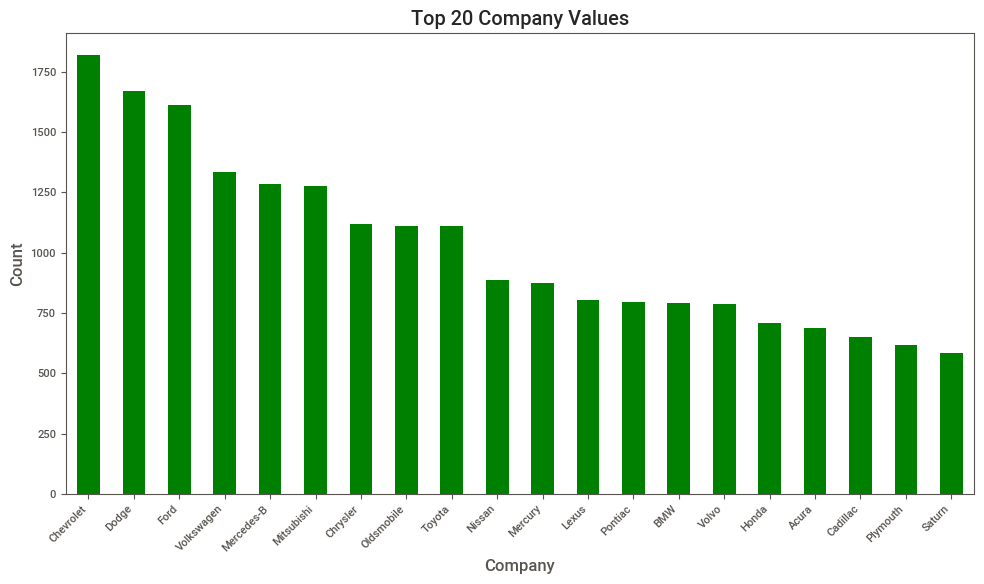

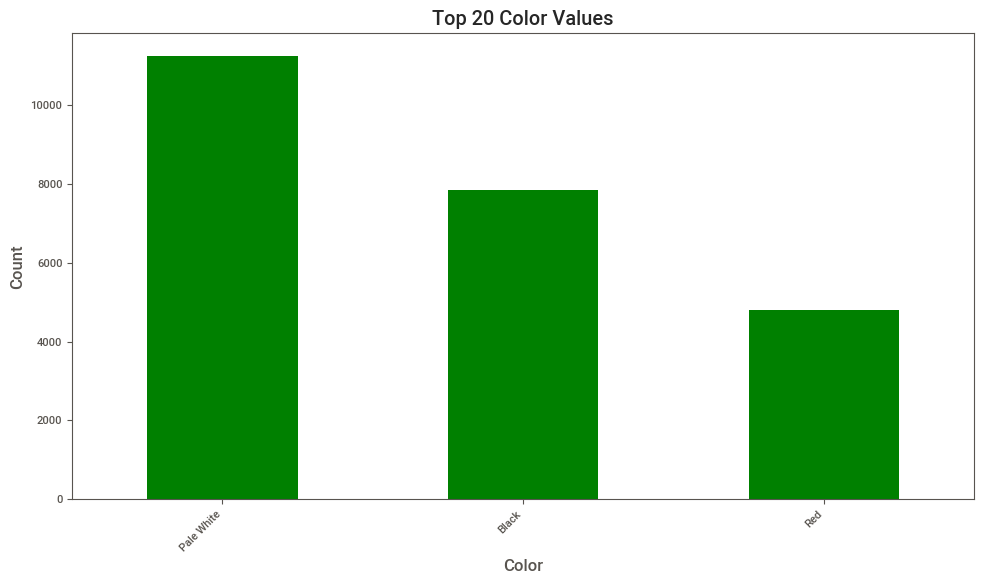

In [59]:
plot_value_counts(df, 'Transmission')
plot_value_counts(df, 'Engine')
plot_value_counts(df, 'Dealer_Name')
plot_value_counts(df, 'Company')
plot_value_counts(df, 'Color')

In [60]:
df.head()

,Car_id,Date,Customer_Name,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Transmission,Color,Price_($),Dealer_No,Body_Style,Phone,Amount_paid_for_insurance,Claim_amount,City,Year,Month,Day
0,C_CND_000001,2022-01-02,Geraldine,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Auto,Black,26000,06457-3834,SUV,8264678,1665,0.00,Riga,2022,1,2
1,C_CND_000002,2022-01-02,Gia,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Auto,Black,19000,60504-7114,SUV,6848189,1332,1900.00,Liepaja,2022,1,2
2,C_CND_000003,2022-01-02,Gianna,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Manual,Red,31500,38701-8047,Passenger,7298798,1897,0.00,Riga,2022,1,2
3,C_CND_000004,2022-01-02,Giselle,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Manual,Pale White,14000,99301-3882,SUV,6257557,1176,0.00,Jelgava,2022,1,2
4,C_CND_000005,2022-01-02,Grace,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Auto,Red,24500,53546-9427,Hatchback,7081483,1323,2450.00,Liepaja,2022,1,2


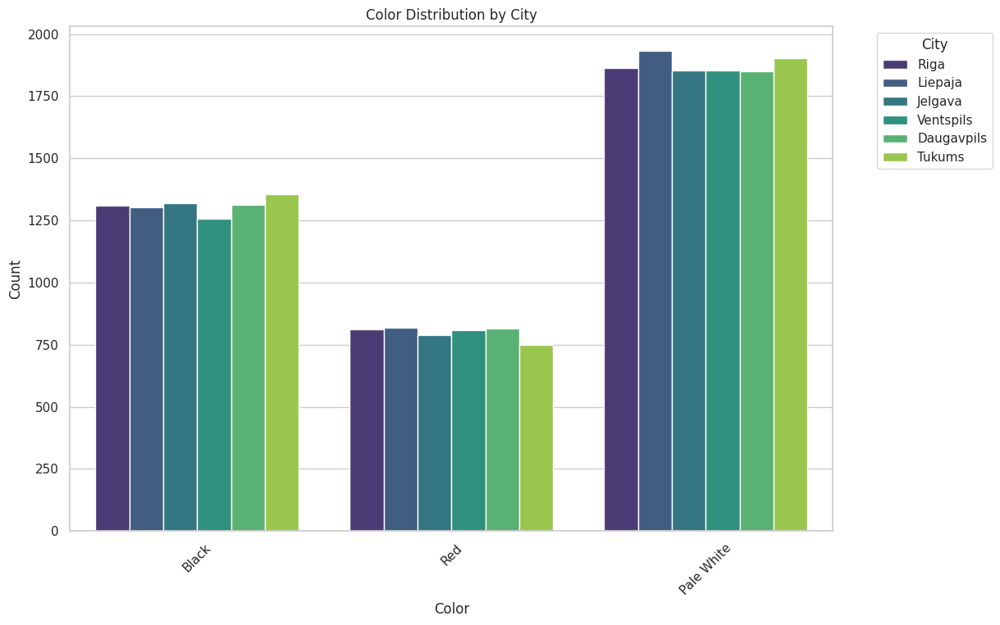

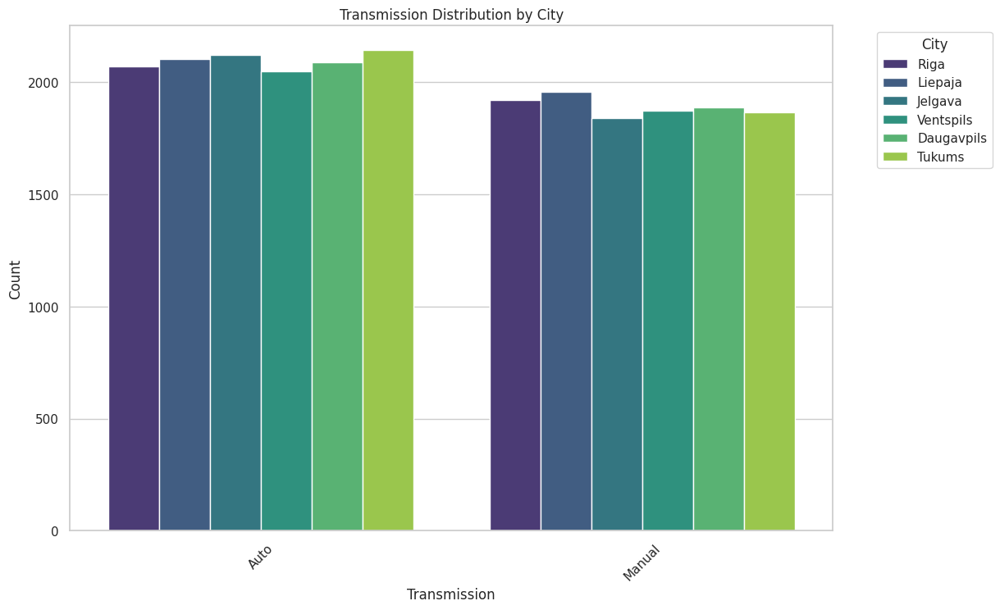

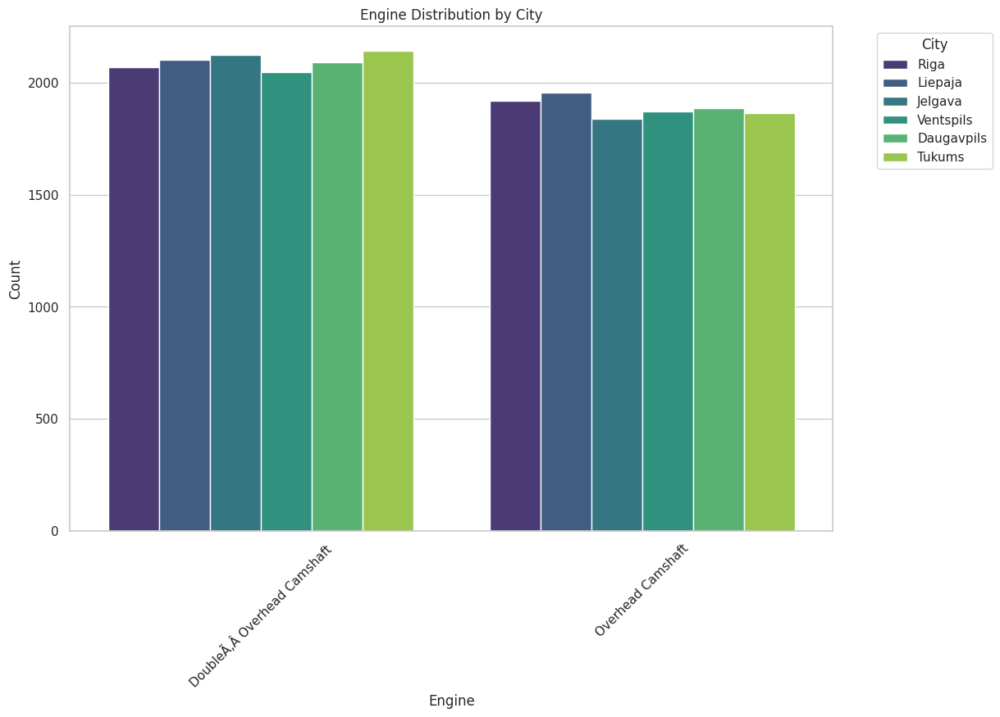

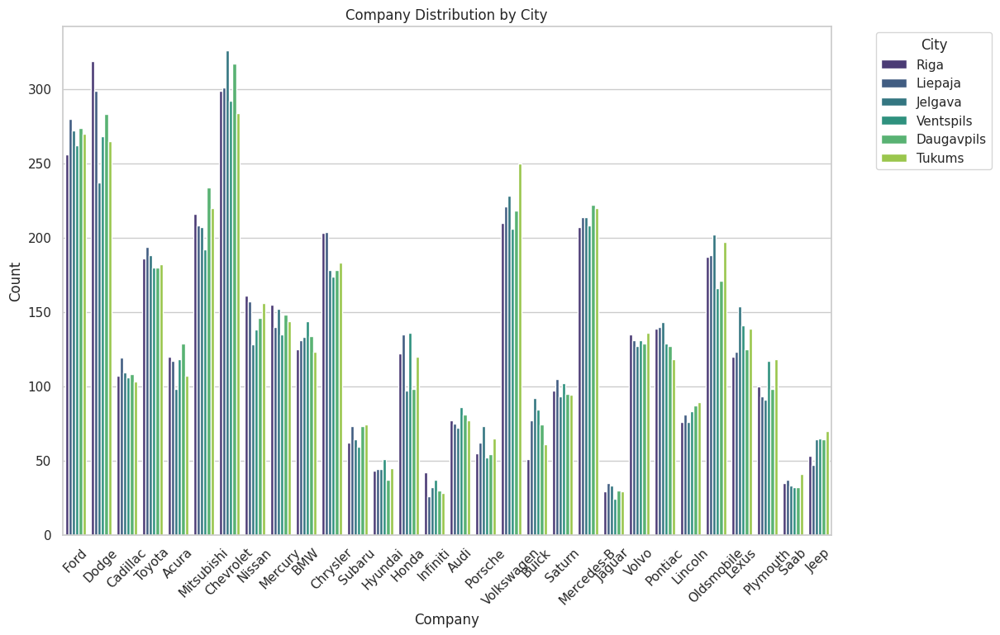

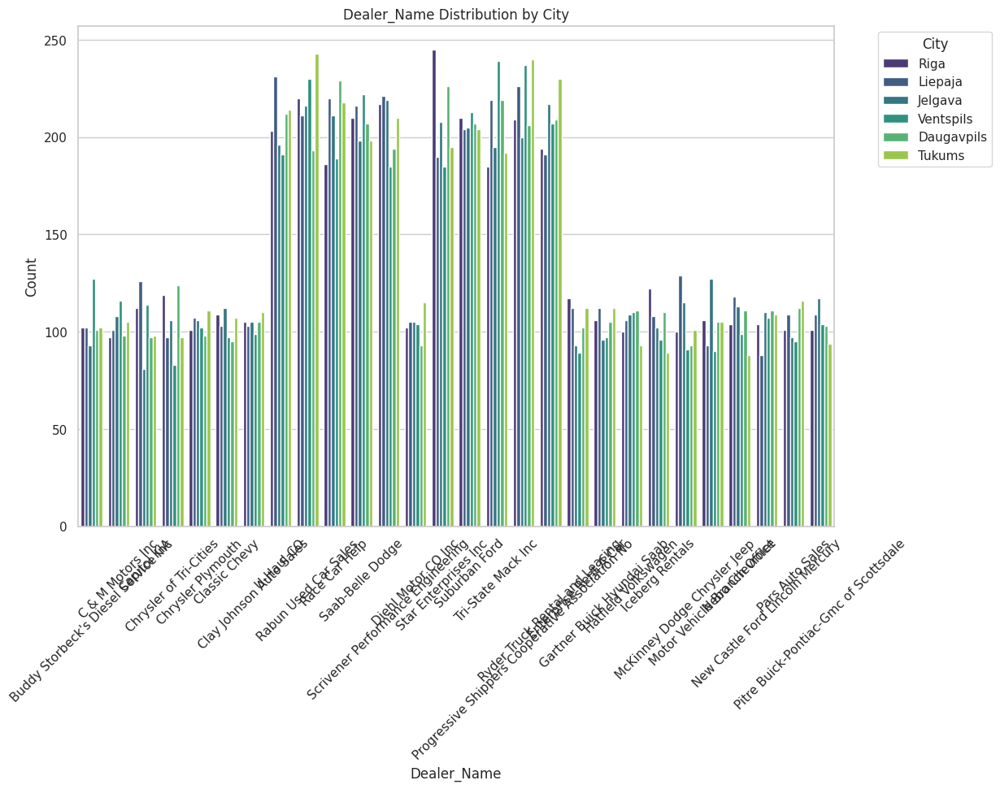

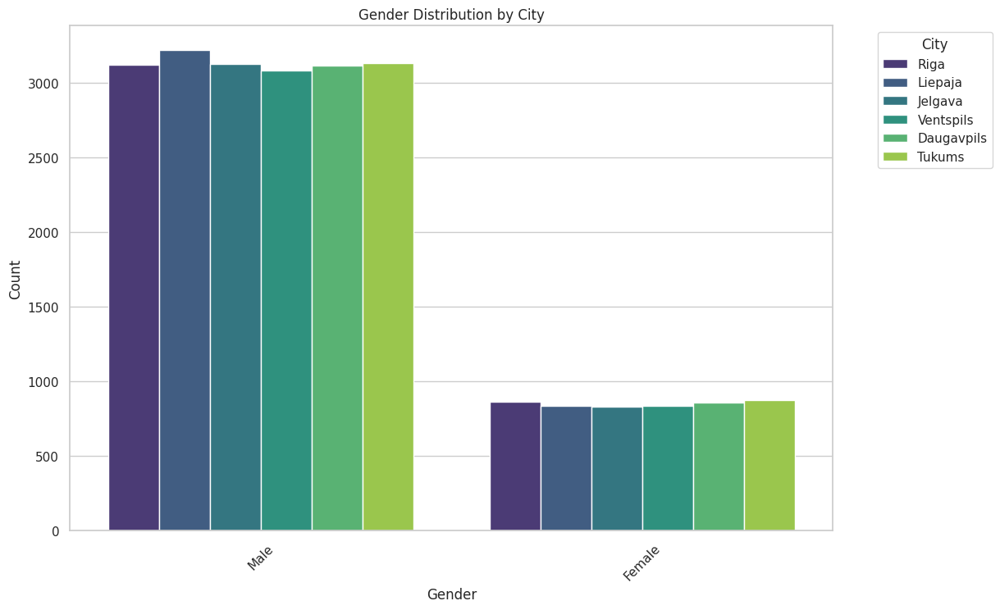

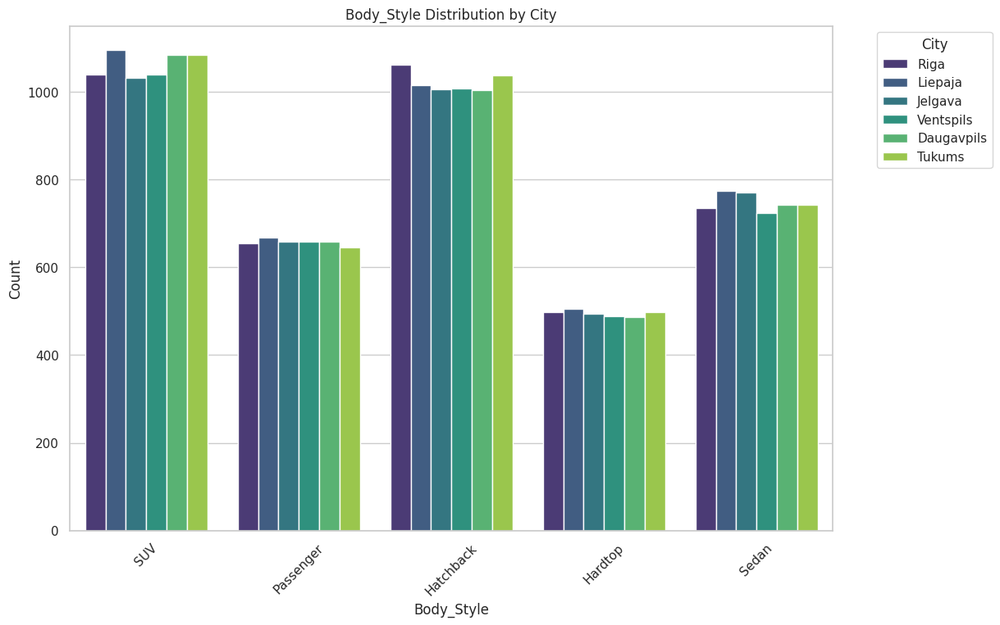

In [61]:
# Set the style of seaborn
sns.set(style="whitegrid")

# Plot Color distribution by City
plot_relationship_with_city('Color')

# Plot Transmission distribution by City
plot_relationship_with_city('Transmission')

# Plot Engine distribution by City
plot_relationship_with_city('Engine')

# Plot Company distribution by City
plot_relationship_with_city('Company')

# Plot Dealer_Name distribution by City
plot_relationship_with_city('Dealer_Name')

# Plot Gender distribution by City
plot_relationship_with_city('Gender')

# Plot Body_Style distribution by City
plot_relationship_with_city('Body_Style')

In [86]:
import altair as alt
import pandas as pd
import numpy as np

# Sample data creation for demonstration, replace this with your actual dataframe 'df'
df = pd.DataFrame({
    'Date': pd.date_range(start='2023-01-01', periods=365, freq='D'),
    'Claim_amount': np.random.rand(365) * 1000,
    'Amount_paid_for_insurance': np.random.rand(365) * 100
})

# Calculate week number and day of year
df['Week_Number'] = df['Date'].dt.isocalendar().week
df['Day_of_Year'] = df['Date'].dt.dayofyear

# Aggregate by week and day of year
weekly_agg = df.groupby('Week_Number')[['Claim_amount', 'Amount_paid_for_insurance']].mean().reset_index()
daily_agg = df.groupby('Day_of_Year')[['Claim_amount', 'Amount_paid_for_insurance']].mean().reset_index()

# Melt the dataframes to long format
weekly_agg_melted = weekly_agg.melt('Week_Number', var_name='Variable', value_name='Average')
daily_agg_melted = daily_agg.melt('Day_of_Year', var_name='Variable', value_name='Average')

# Create line plot for weekly aggregation
weekly_chart = alt.Chart(weekly_agg_melted, title='Average Claim Amount and Insurance Paid by Week').mark_line(point=True).encode(
    x='Week_Number:O',
    y='Average:Q',
    color='Variable:N',
    tooltip=['Week_Number', 'Average', 'Variable']
).interactive()

# Create line plot for daily aggregation
daily_chart = alt.Chart(daily_agg_melted, title='Average Claim Amount and Insurance Paid by Day of Year').mark_line(point=True).encode(
    x='Day_of_Year:O',
    y='Average:Q',
    color='Variable:N',
    tooltip=['Day_of_Year', 'Average', 'Variable']
).interactive()

# Display the plots
weekly_chart.display()
daily_chart.display()


alt.Chart(...)

alt.Chart(...)

In [ ]:
# Drop one of each pair of irrelevant & highly correlated columns
columns_to_drop = ['Car_id','Amount_paid_for_insurance', 'Dealer_No', 'Transmission','Customer_Name','Phone']
df.drop(columns=columns_to_drop, axis=1, inplace=True)

In [ ]:
design_report = ProfileReport(df)
design_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Using AutoViz

Shape of your Data Set loaded: (23906, 15)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  1
    Number of Integer-Categorical Columns =  4
    Number of String-Categorical Columns =  5
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  2
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  1
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    15 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix these data quality issues in the dataset, import FixDQ from autoviz...
    All variab

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.000000,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.000000,0,,,No issue
Annual_Income,int64,0.000000,10,10080.000000,11200000.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.000000,0,,,No issue
Company,object,0.000000,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.000000,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.000000,0,,,No issue
Color,object,0.000000,0,,,No issue
Price_($),int64,0.000000,3,1200.000000,85800.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.000000,0,,,No issue


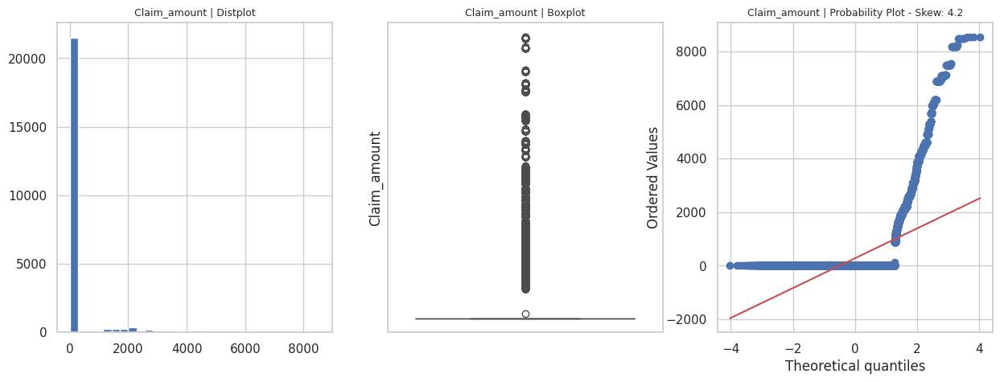

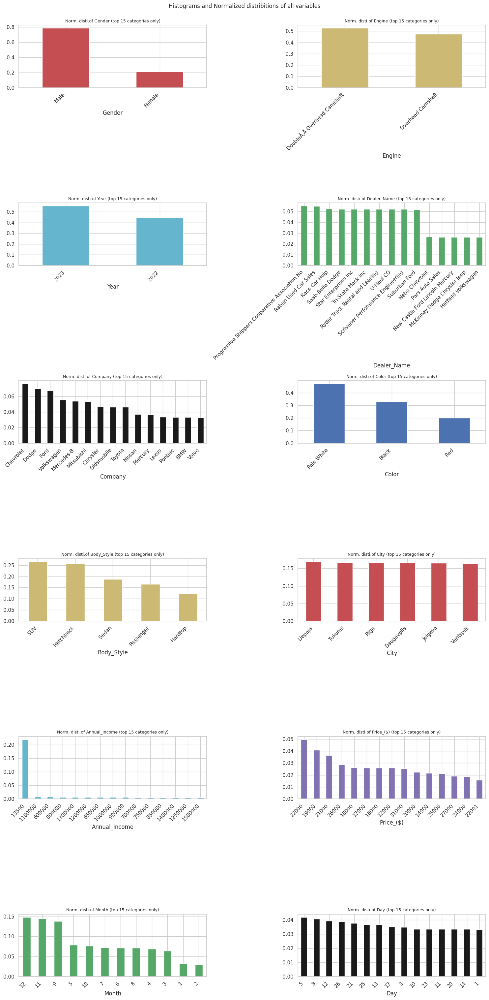

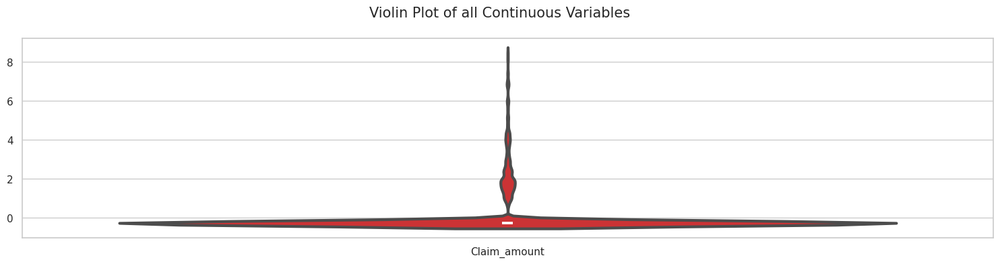

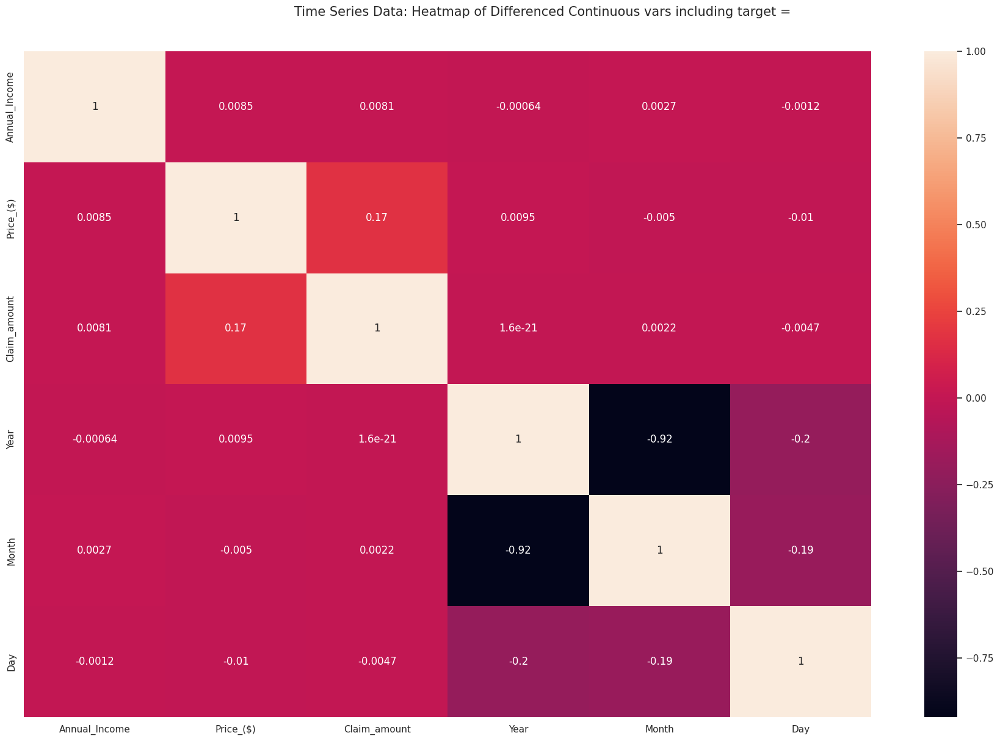

<Figure size 1500x0 with 0 Axes>

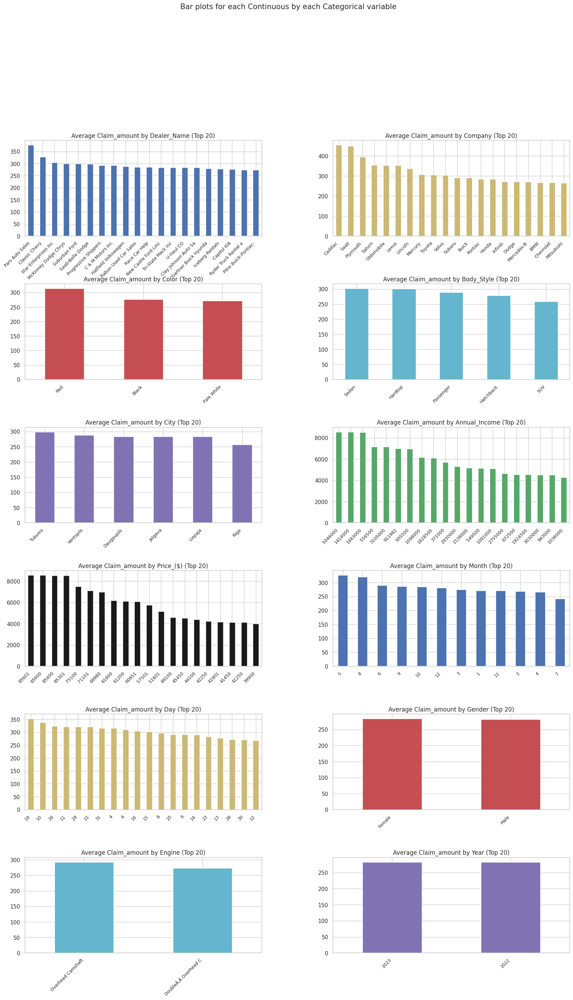

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

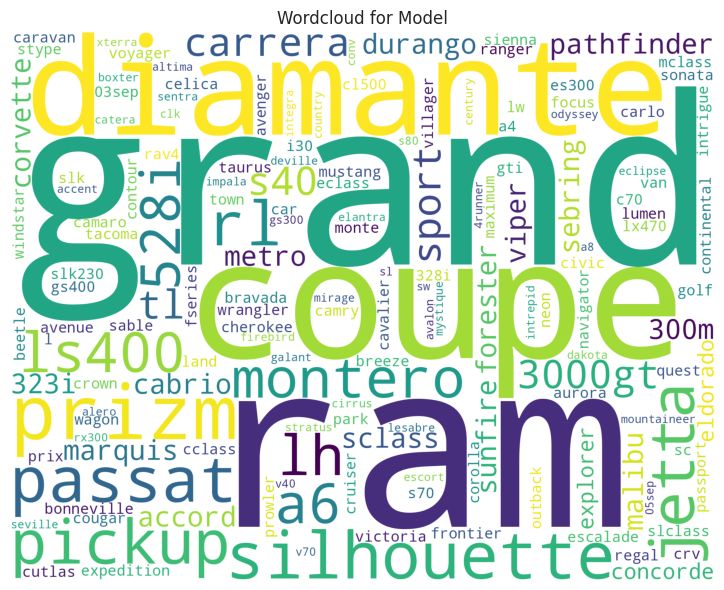

All Plots done
Time to run AutoViz = 31 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
AV = AutoViz_Class()
dft = AV.AutoViz(
    "",
    sep=",",
    depVar="",
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=350000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

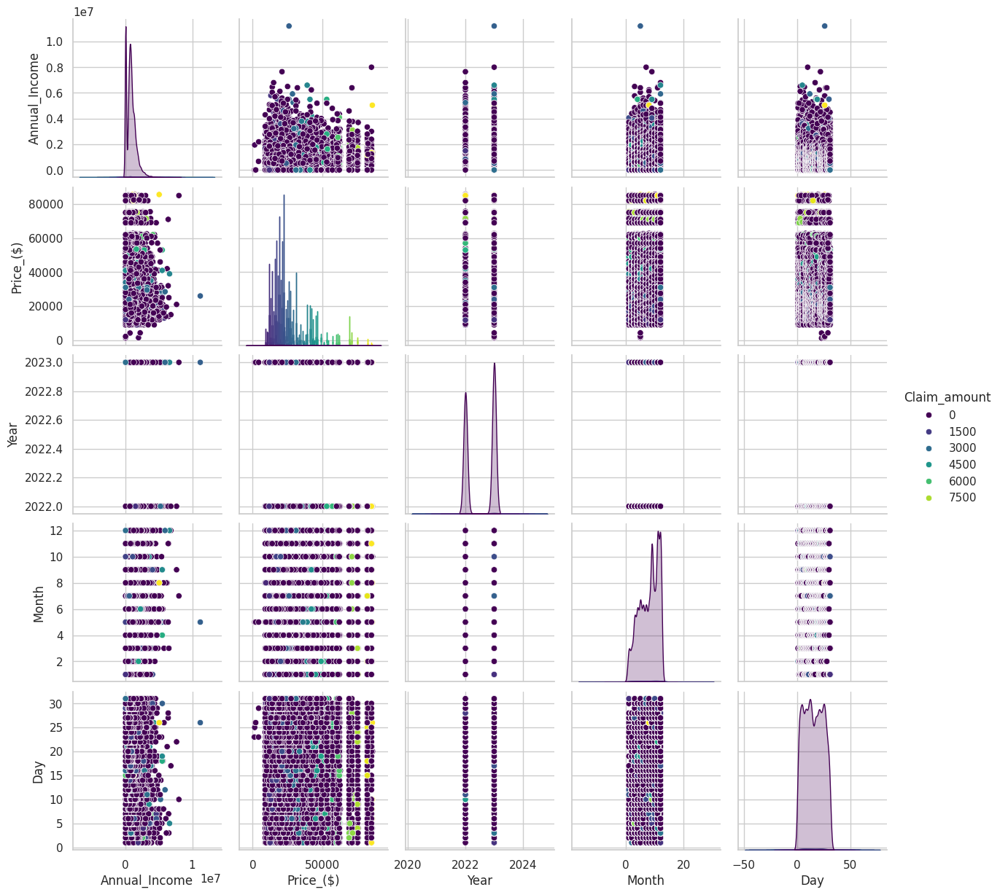

In [ ]:
sns.pairplot(df, hue="Claim_amount", palette="viridis");

### Observations from the above EDA

In [ ]:
df['Company'].value_counts ()

Company
Chevrolet     1819
Dodge         1671
Ford          1614
Volkswagen    1333
Mercedes-B    1285
Mitsubishi    1277
Chrysler      1120
Oldsmobile    1111
Toyota        1110
Nissan         886
Mercury        874
Lexus          802
Pontiac        796
BMW            790
Volvo          789
Honda          708
Acura          689
Cadillac       652
Plymouth       617
Saturn         586
Lincoln        492
Audi           468
Buick          439
Subaru         405
Jeep           363
Porsche        361
Hyundai        264
Saab           210
Infiniti       195
Jaguar         180
Name: count, dtype: int64

In [ ]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 15)


-----------------------------------Top 5 Records-------------------------------------
+----+---------------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+------------+-------------+--------------+----------------+---------+--------+---------+-------+
|    | Date                | Gender   |   Annual_Income | Dealer_Name                         | Company   | Model      | Engine                      | Color      |   Price_($) | Body_Style   |   Claim_amount | City    |   Year |   Month |   Day |
|----+---------------------+----------+-----------------+-------------------------------------+-----------+------------+-----------------------------+------------+-------------+--------------+----------------+---------+--------+------

### Fixing Data Quality Issues

In [ ]:
fixdq = FixDQ()
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.000000,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.000000,0,,,No issue
Annual_Income,int64,0.000000,10,10080.000000,11200000.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.000000,0,,,No issue
Company,object,0.000000,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.000000,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.000000,0,,,No issue
Color,object,0.000000,0,,,No issue
Price_($),int64,0.000000,3,1200.000000,85800.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.000000,0,,,No issue


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Date,datetime64[ns],0.00,2,,,Possible date-time colum: transform before modeling step.
Gender,object,0.00,0,,,No issue
Annual_Income,int64,0.00,10,10080.00,11200000.00,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.00,0,,,No issue
Company,object,0.00,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.00,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.00,0,,,No issue
Color,object,0.00,0,,,No issue
Price_($),int64,0.00,3,1200.00,85800.00,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.00,0,,,No issue


### SweetViz

In [ ]:
sweet_report = sv.analyze(df)
sweet_report.show_html('sweetviz_report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



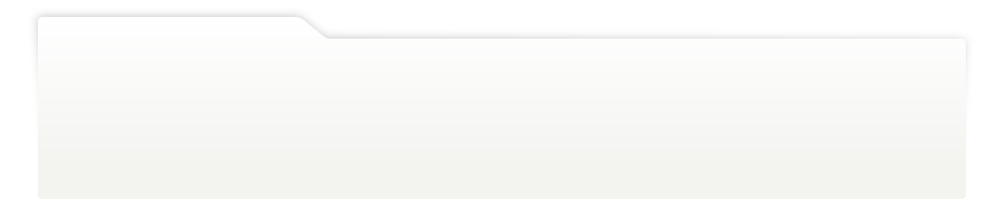
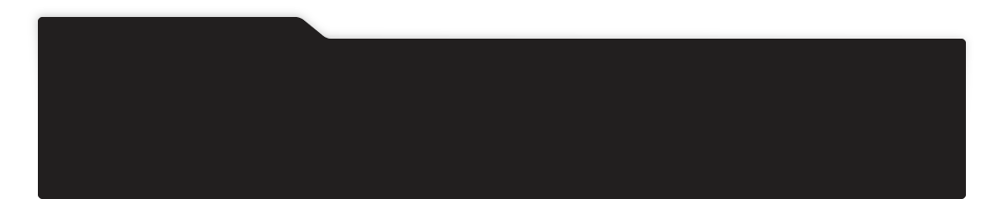
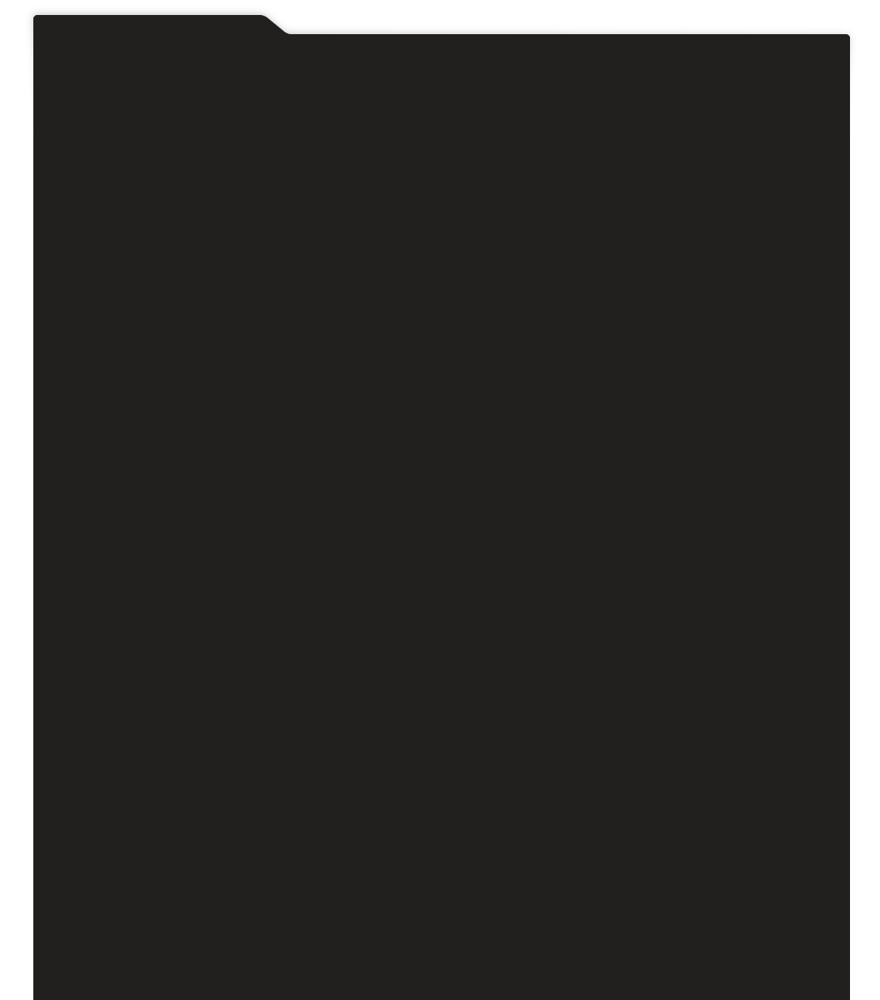
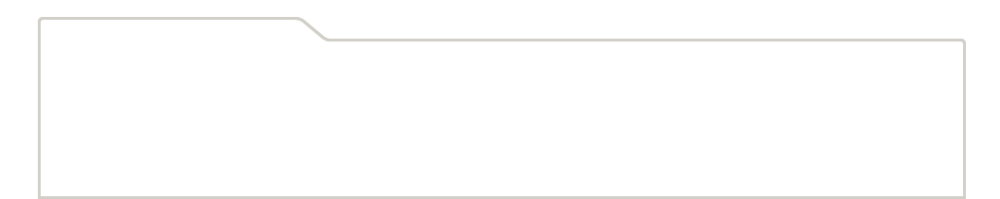
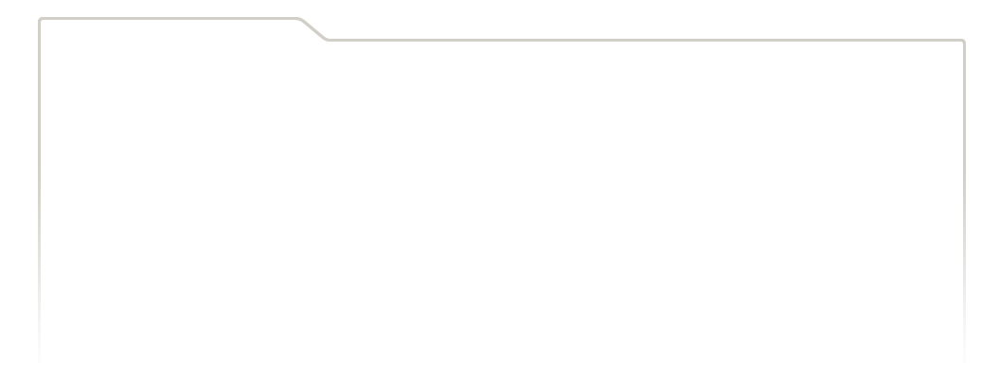
...
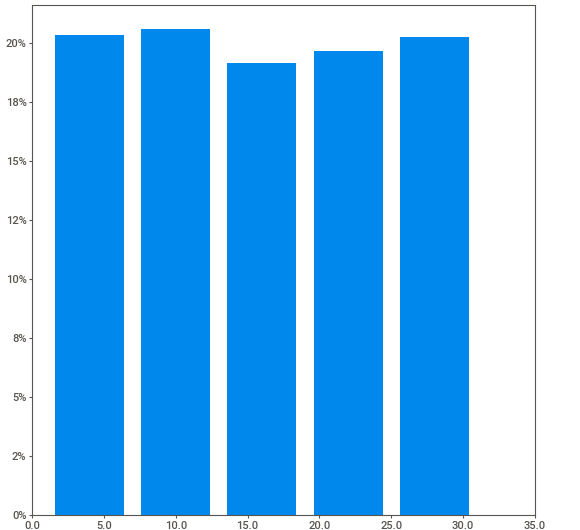
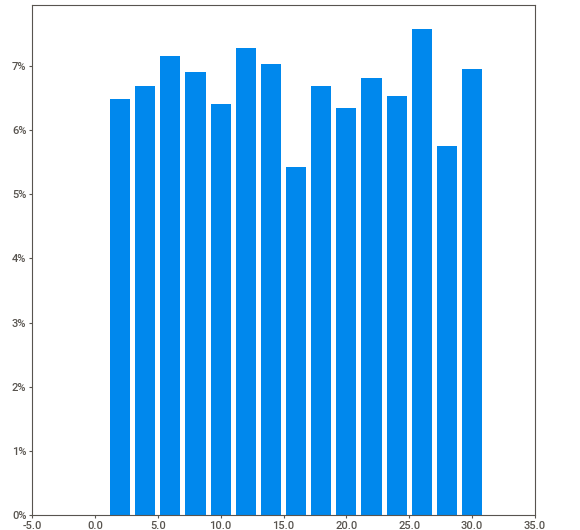
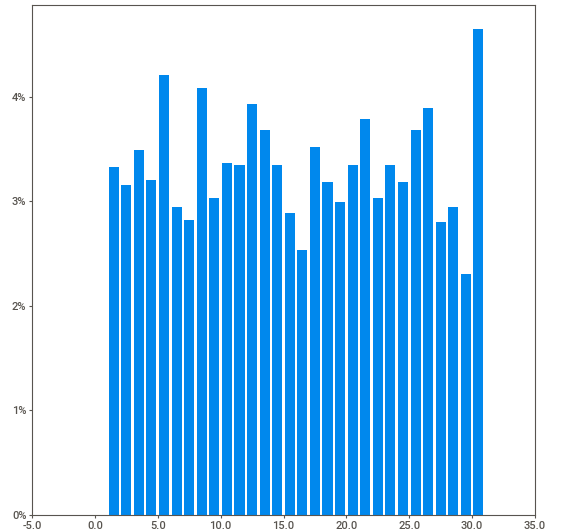
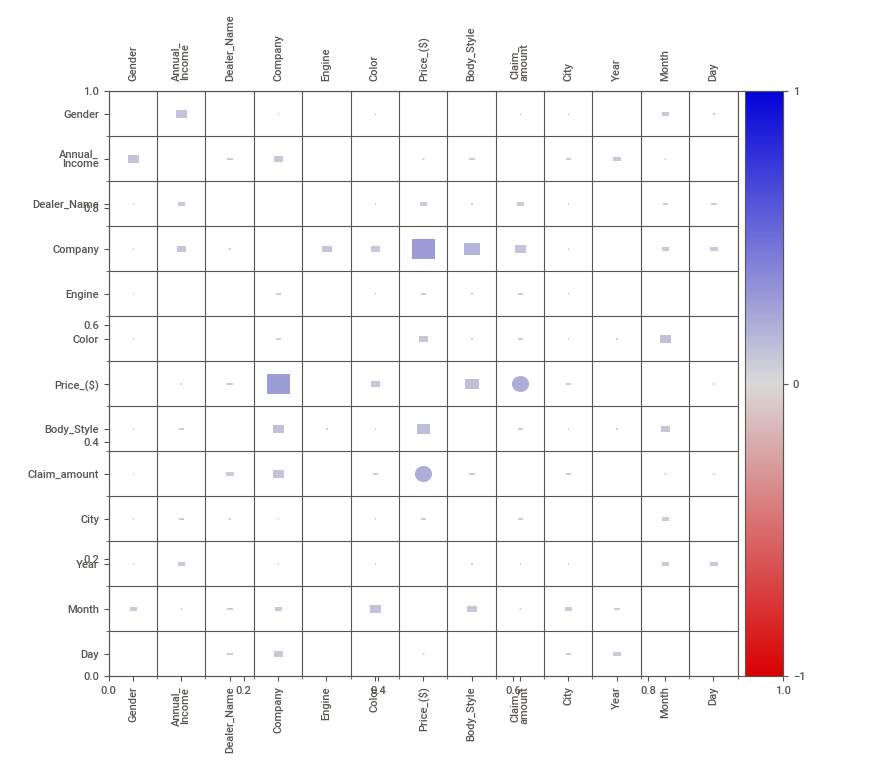
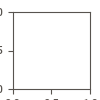

Report '/content/sweetviz_report.html' was saved to storage.


In [ ]:
sweet_report.show_notebook(w=None, h=None,
scale=None,
layout='vertical',
filepath='/content/sweetviz_report.html')

In [ ]:
df.head(5)

,Date,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,2022-01-02,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000,SUV,0.00,Riga,2022,1,2
1,2022-01-02,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000,SUV,1900.00,Liepaja,2022,1,2
2,2022-01-02,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500,Passenger,0.00,Riga,2022,1,2
3,2022-01-02,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000,SUV,0.00,Jelgava,2022,1,2
4,2022-01-02,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500,Hatchback,2450.00,Liepaja,2022,1,2


In [ ]:
import pandas as pd
import altair as alt

# Convert the `Date` column to datetime format, inferring format and assuming day first
df['Date'] = pd.to_datetime(df['Date'], format='mixed', dayfirst=True)

# Extract the month from the `Date` column
df['Month'] = df['Date'].dt.to_period('M')

# Group by `Month` and calculate the sum of `Claim amount`
claims_by_month = df.groupby('Month')['Claim_amount'].sum().reset_index()

# Sort the DataFrame by `Month` in chronological order
claims_by_month = claims_by_month.sort_values('Month')

# Convert the `Month` column to string
claims_by_month['Month'] = claims_by_month['Month'].astype(str)

# Create a line chart of `Claim amount` by `Month`
chart = alt.Chart(claims_by_month).mark_line().encode(
    x=alt.X('Month:N', axis=alt.Axis(title='Month', labelAngle=-45)),
    y=alt.Y('Claim_amount:Q', axis=alt.Axis(title='Total Claim_amount')),
    tooltip = ['Month', 'Claim_amount']
).properties(
    title='Total Claim_amount by Month'
).interactive()

# Set figure size
chart = chart.properties(width=800, height=400)

# Display the chart
chart


alt.Chart(...)

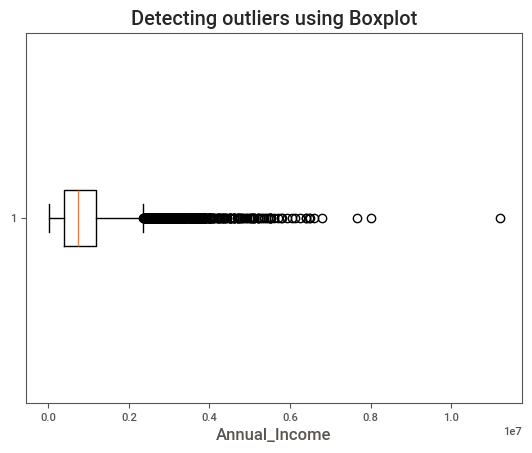

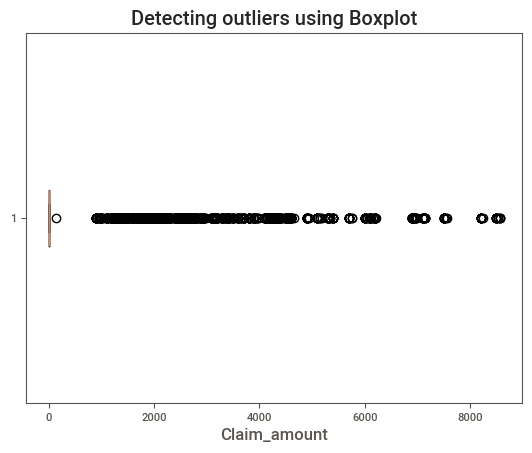

In [ ]:
# Boxplot for detecting outliers
detect_outliers_boxplot(df, 'Annual_Income', vert=False)
detect_outliers_boxplot(df, 'Claim_amount', vert=False)

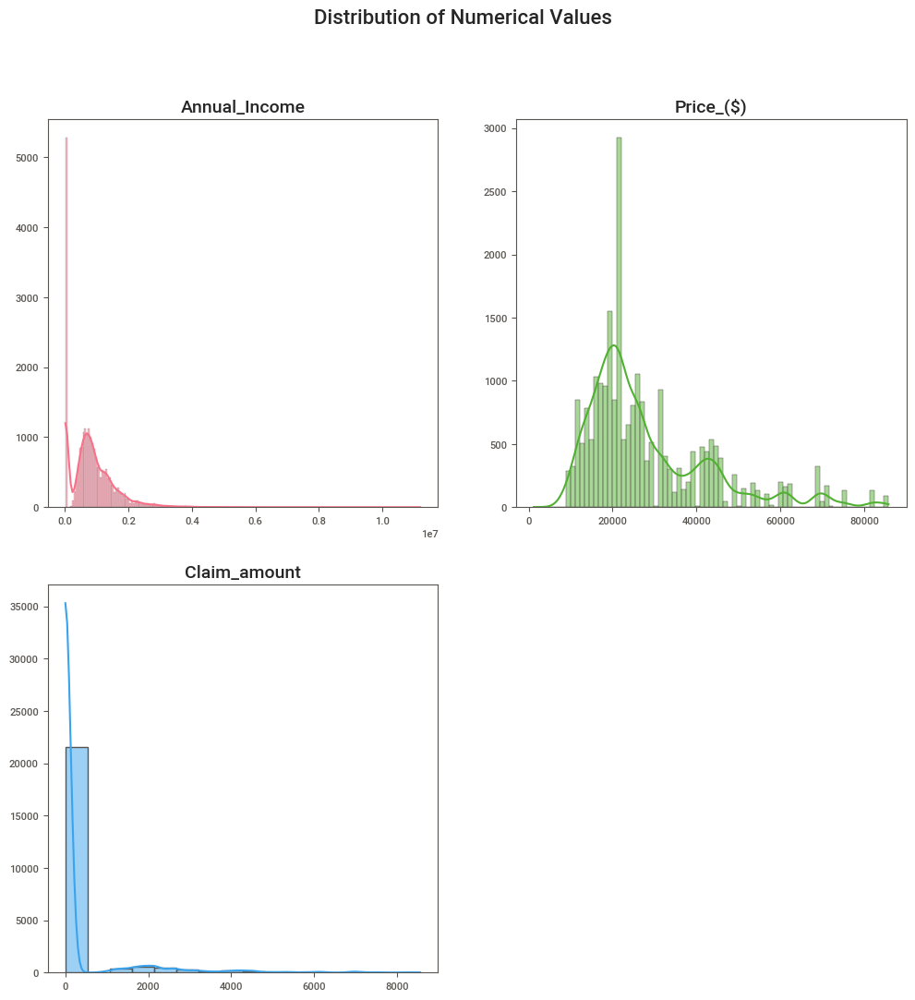

In [ ]:
plot_numerical_distributions(df, ['Annual_Income', 'Price_($)', 'Claim_amount'])

### Handling outliers

In [ ]:
# Handling Outliers using capping
df['Annual_Income'] = cap_outliers(df['Annual_Income'])
df['Price_($)'] = cap_outliers(df['Price_($)'])
df['Claim_amount'] = cap_outliers(df['Claim_amount'])

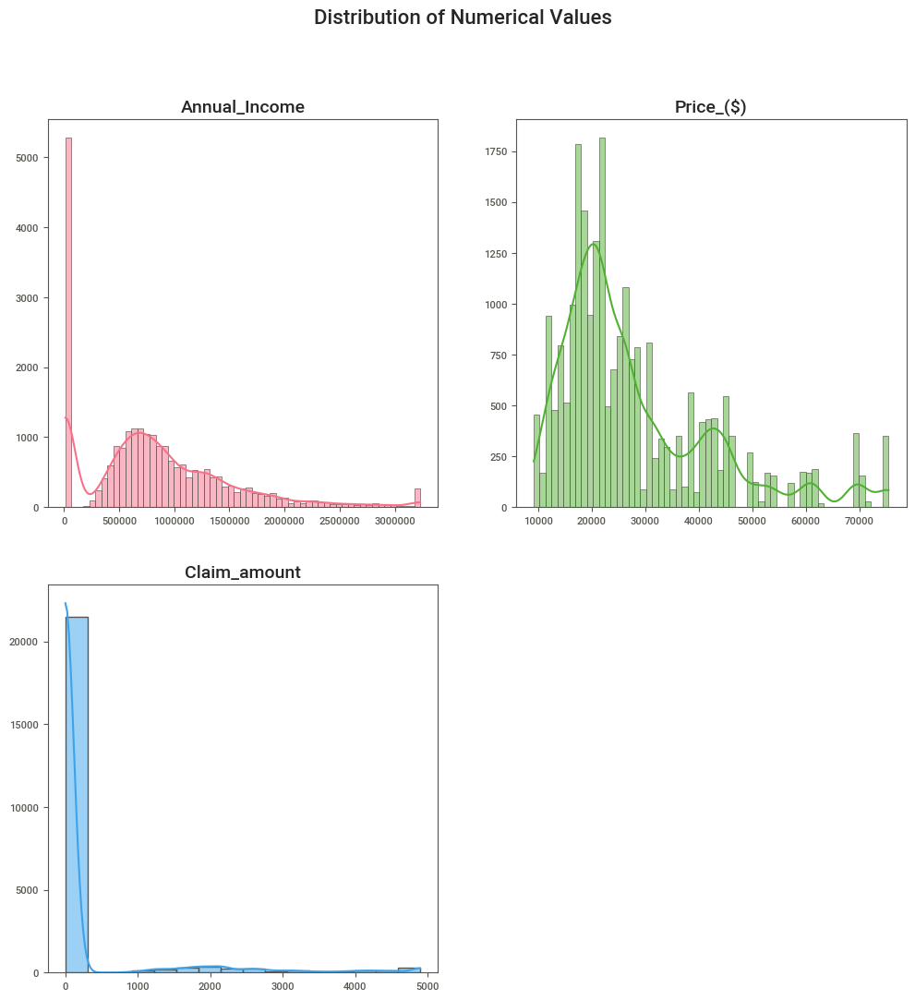

In [ ]:
plot_numerical_distributions(df, ['Annual_Income', 'Price_($)', 'Claim_amount'])

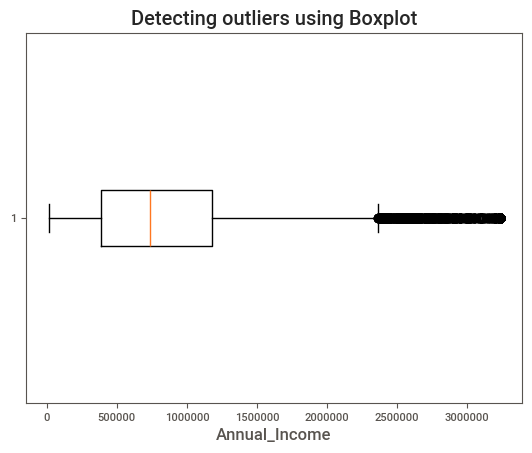

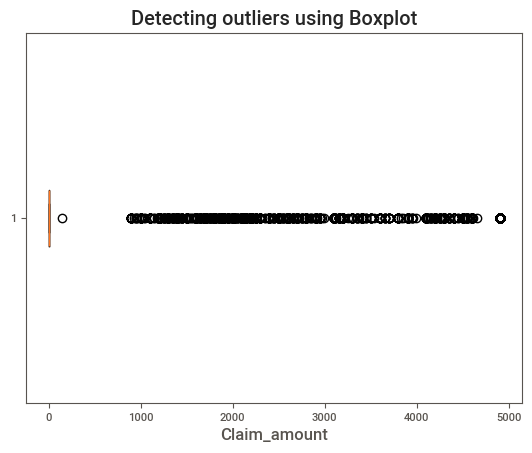

In [ ]:
# Boxplot for detecting outliers
detect_outliers_boxplot(df, 'Annual_Income', vert=False)
detect_outliers_boxplot(df, 'Claim_amount', vert=False)

In [ ]:
df.head()

,Date,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,2022-01-02,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000.00,SUV,0.00,Riga,2022,1,2
1,2022-01-02,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000.00,SUV,1900.00,Liepaja,2022,1,2
2,2022-01-02,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500.00,Passenger,0.00,Riga,2022,1,2
3,2022-01-02,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000.00,SUV,0.00,Jelgava,2022,1,2
4,2022-01-02,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500.00,Hatchback,2450.00,Liepaja,2022,1,2


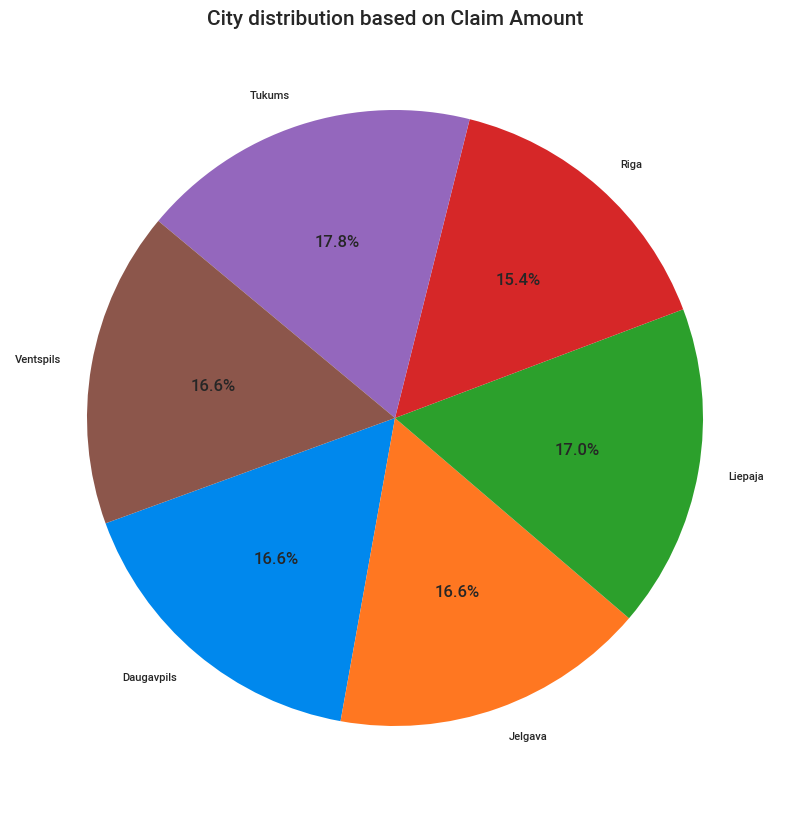

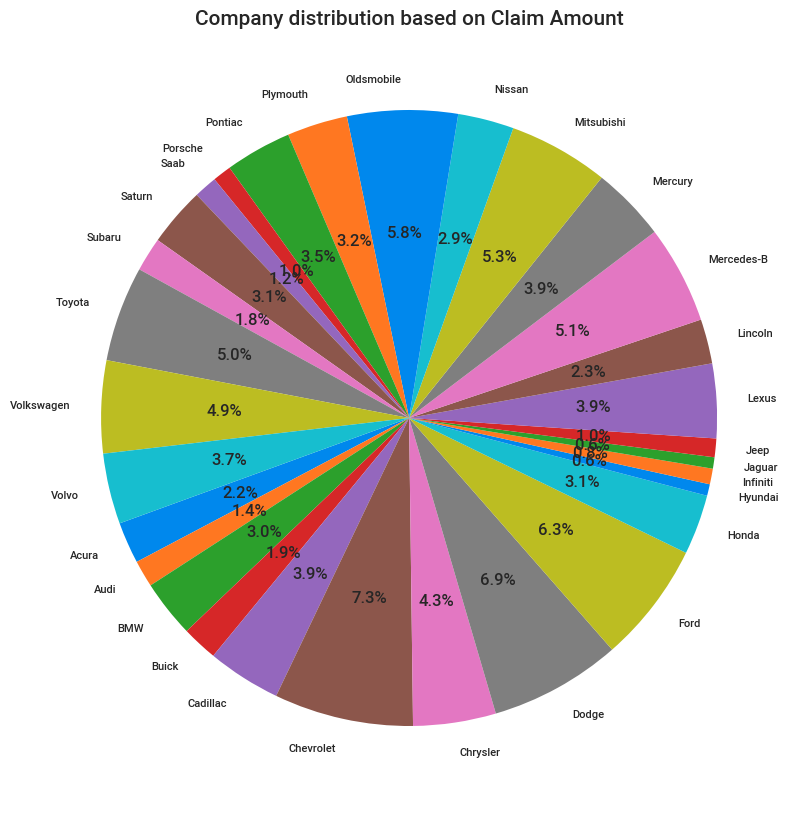

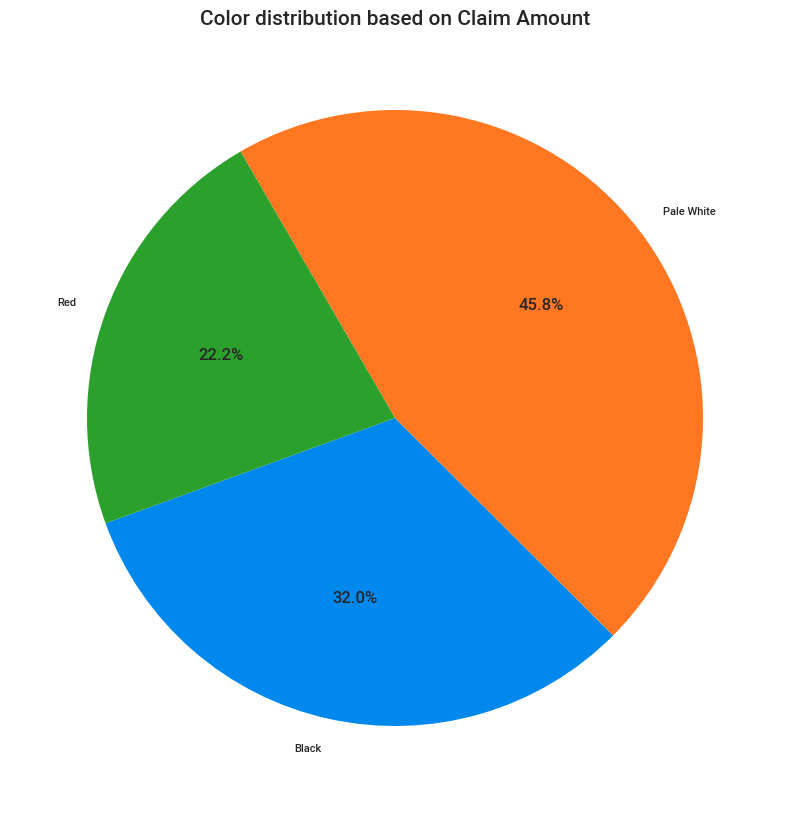

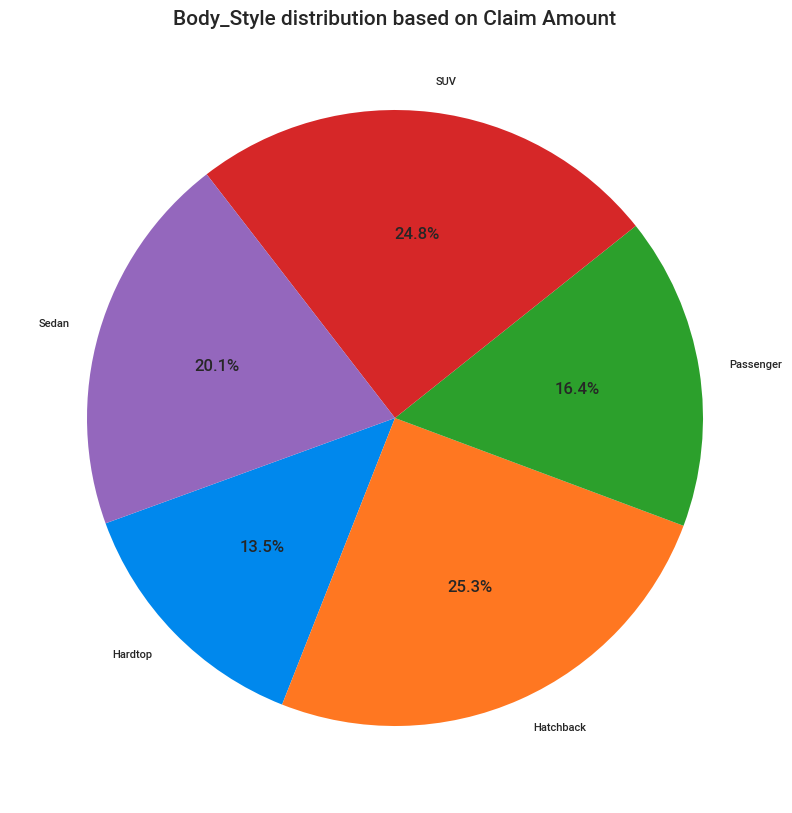

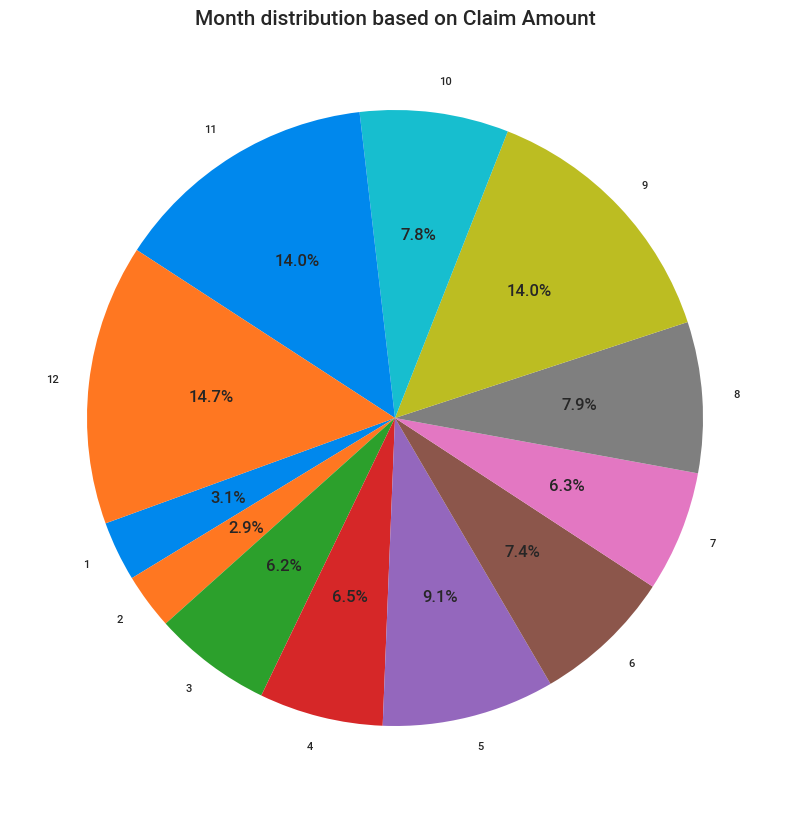

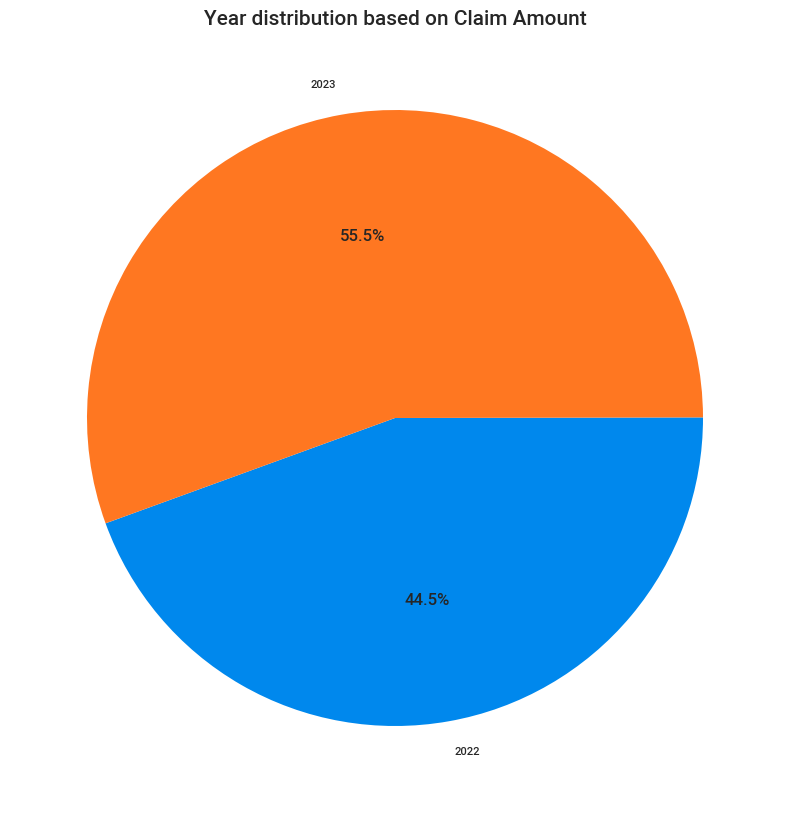

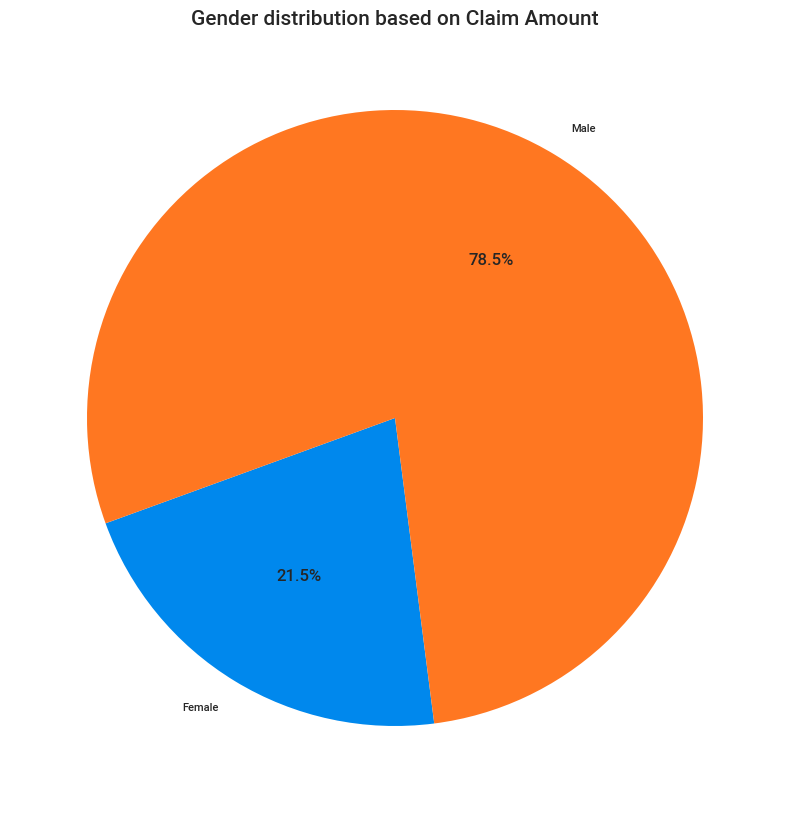

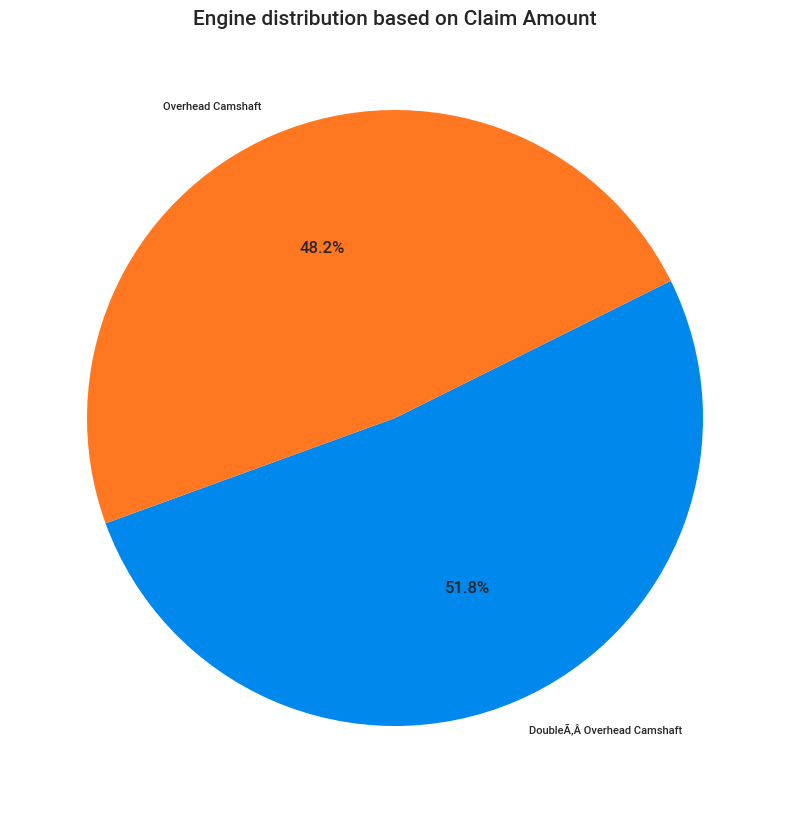

In [ ]:
plot_pie_distribution(df, 'City', 'Claim_amount', 'City distribution based on Claim Amount')
plot_pie_distribution(df, 'Company', 'Claim_amount', 'Company distribution based on Claim Amount')
plot_pie_distribution(df, 'Color', 'Claim_amount', 'Color distribution based on Claim Amount')
plot_pie_distribution(df, 'Body_Style', 'Claim_amount', 'Body_Style distribution based on Claim Amount')
plot_pie_distribution(df, 'Month', 'Claim_amount', 'Month distribution based on Claim Amount')
plot_pie_distribution(df, 'Year', 'Claim_amount', 'Year distribution based on Claim Amount')
plot_pie_distribution(df, 'Gender', 'Claim_amount', 'Gender distribution based on Claim Amount')
plot_pie_distribution(df, 'Engine', 'Claim_amount', 'Engine distribution based on Claim Amount')

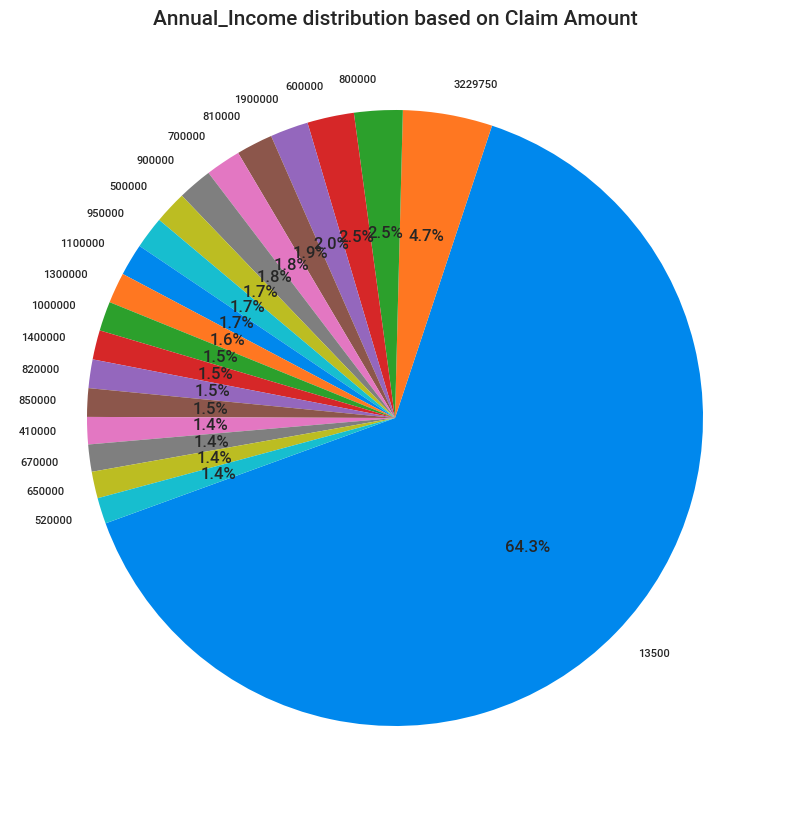

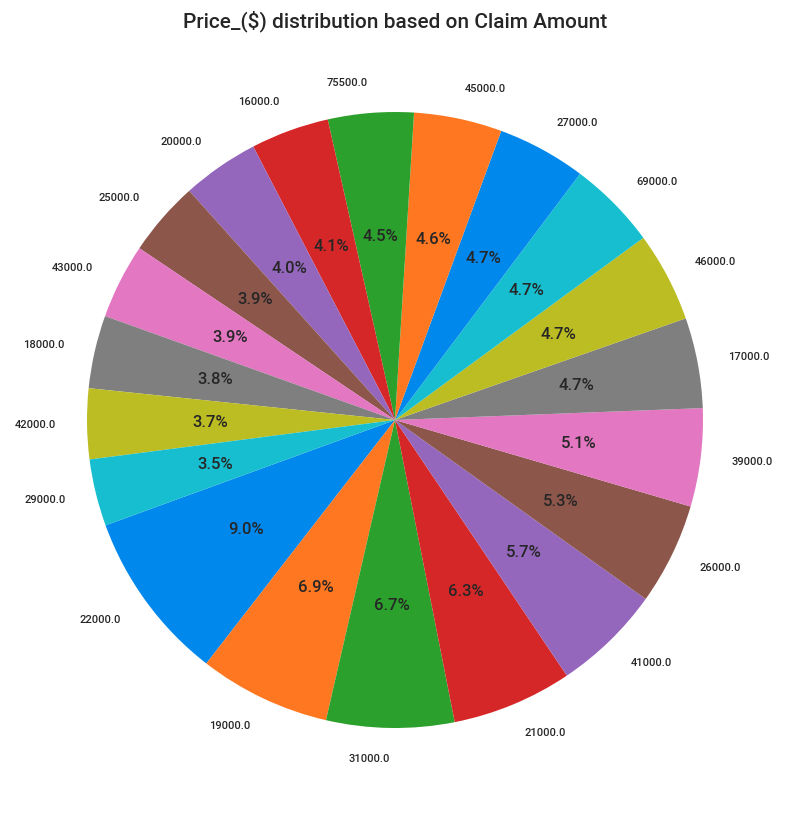

In [ ]:
plot_pie_distribution_percentage(df, 'Annual_Income', 'Claim_amount', 'Annual_Income distribution based on Claim Amount')
plot_pie_distribution_percentage(df, 'Price_($)', 'Claim_amount', 'Price_($) distribution based on Claim Amount')

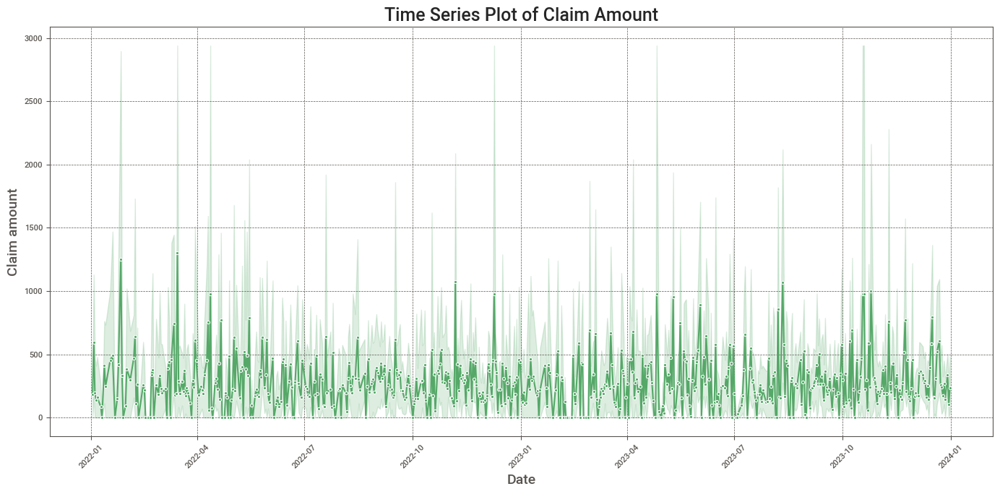

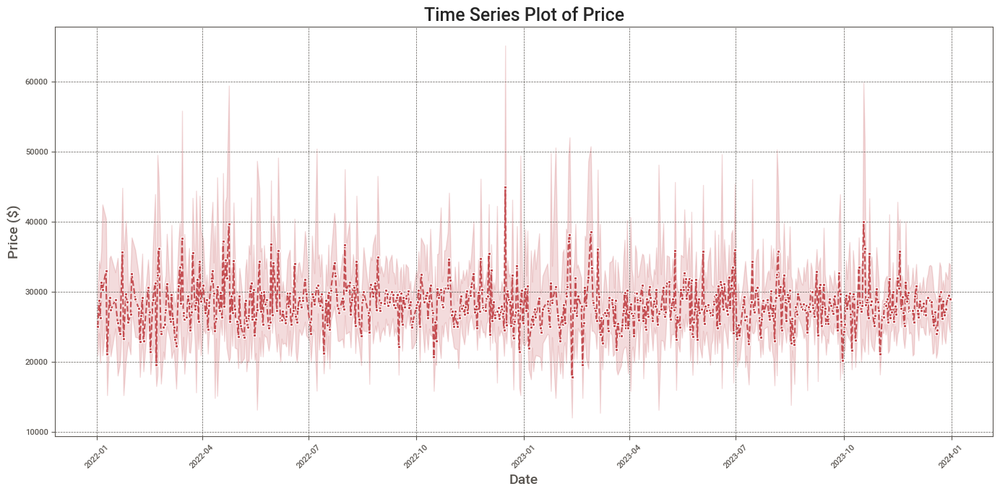

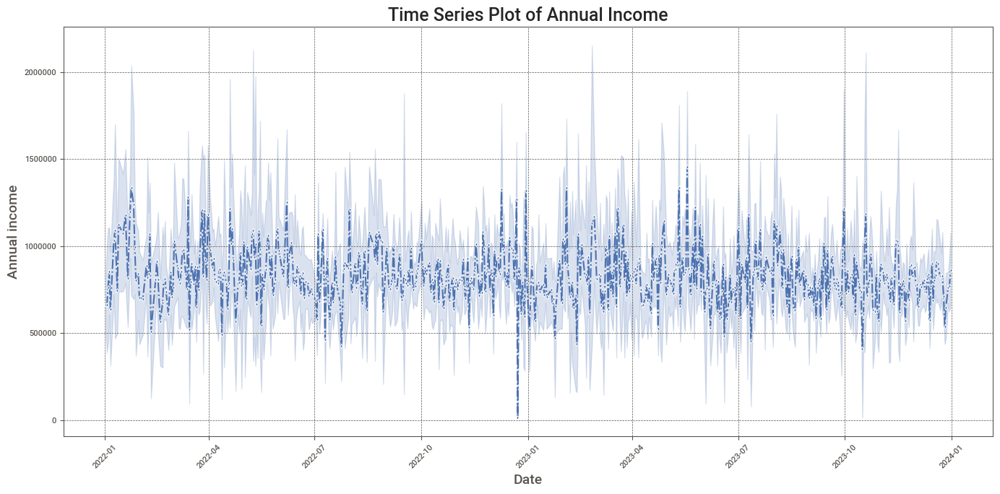

In [ ]:
plot_time_series(df, 'Date', 'Claim_amount', 'Time Series Plot of Claim Amount', line_style='-', marker='o', color='g')
plot_time_series(df, 'Date', 'Price_($)', 'Time Series Plot of Price', line_style='--', marker='s', color='r')
plot_time_series(df, 'Date', 'Annual_Income', 'Time Series Plot of Annual Income', line_style='-.', marker='d', color='b')

In [ ]:
df = drop_column(df, 'Date')

In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,Male,13500,Buddy Storbeck's Diesel Service Inc,Ford,Expedition,DoubleÃ‚Â Overhead Camshaft,Black,26000.00,SUV,0.00,Riga,2022,1,2
1,Male,1480000,C & M Motors Inc,Dodge,Durango,DoubleÃ‚Â Overhead Camshaft,Black,19000.00,SUV,1900.00,Liepaja,2022,1,2
2,Male,1035000,Capitol KIA,Cadillac,Eldorado,Overhead Camshaft,Red,31500.00,Passenger,0.00,Riga,2022,1,2
3,Male,13500,Chrysler of Tri-Cities,Toyota,Celica,Overhead Camshaft,Pale White,14000.00,SUV,0.00,Jelgava,2022,1,2
4,Male,1465000,Chrysler Plymouth,Acura,TL,DoubleÃ‚Â Overhead Camshaft,Red,24500.00,Hatchback,2450.00,Liepaja,2022,1,2


In [ ]:
fixdq = FixDQ()
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,object,0.000000,0,,,No issue
Annual_Income,int64,0.000000,9,13500.000000,3229750.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.000000,0,,,No issue
Company,object,0.000000,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.000000,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.000000,0,,,No issue
Color,object,0.000000,0,,,No issue
Price_($),float64,0.000000,NA,9200.050000,75500.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.000000,0,,,No issue
Claim_amount,float64,0.000000,NA,0.000000,4900.000000,Column has 2390 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,object,0.00,0,,,No issue
Annual_Income,int64,0.00,9,13500.00,3229750.00,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,object,0.00,0,,,No issue
Company,object,0.00,0,,,"3 rare categories: ['Saab', 'Infiniti', 'Jaguar']. Group them into a single category or drop the categories."
Model,object,0.00,0,,,Possible high cardinality column with 154 unique values: Use hash encoding or text embedding to reduce dimension.
Engine,object,0.00,0,,,No issue
Color,object,0.00,0,,,No issue
Price_($),float64,0.00,NA,9200.05,75500.00,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,object,0.00,0,,,No issue
Claim_amount,float64,0.00,NA,0.00,4900.00,Column has 2390 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


In [ ]:
from sklearn.preprocessing import LabelEncoder
df = label_encode_column(df, 'Body_Style')
df = label_encode_column(df, 'Color')
df = label_encode_column(df, 'Engine')
df = label_encode_column(df, 'Model')
df = label_encode_column(df, 'City')
df = label_encode_column(df, 'Month')
df = label_encode_column(df, 'Gender')
df = label_encode_column(df, 'Company')
df = label_encode_column(df, 'Dealer_Name')

In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000.00,3,0.00,3,2022,0,2
1,1,1480000,1,7,52,0,0,19000.00,3,1900.00,2,2022,0,2
2,1,1035000,2,4,57,1,2,31500.00,2,0.00,3,2022,0,2
3,1,13500,4,27,36,1,1,14000.00,3,0.00,1,2022,0,2
4,1,1465000,3,0,141,0,2,24500.00,1,2450.00,2,2022,0,2


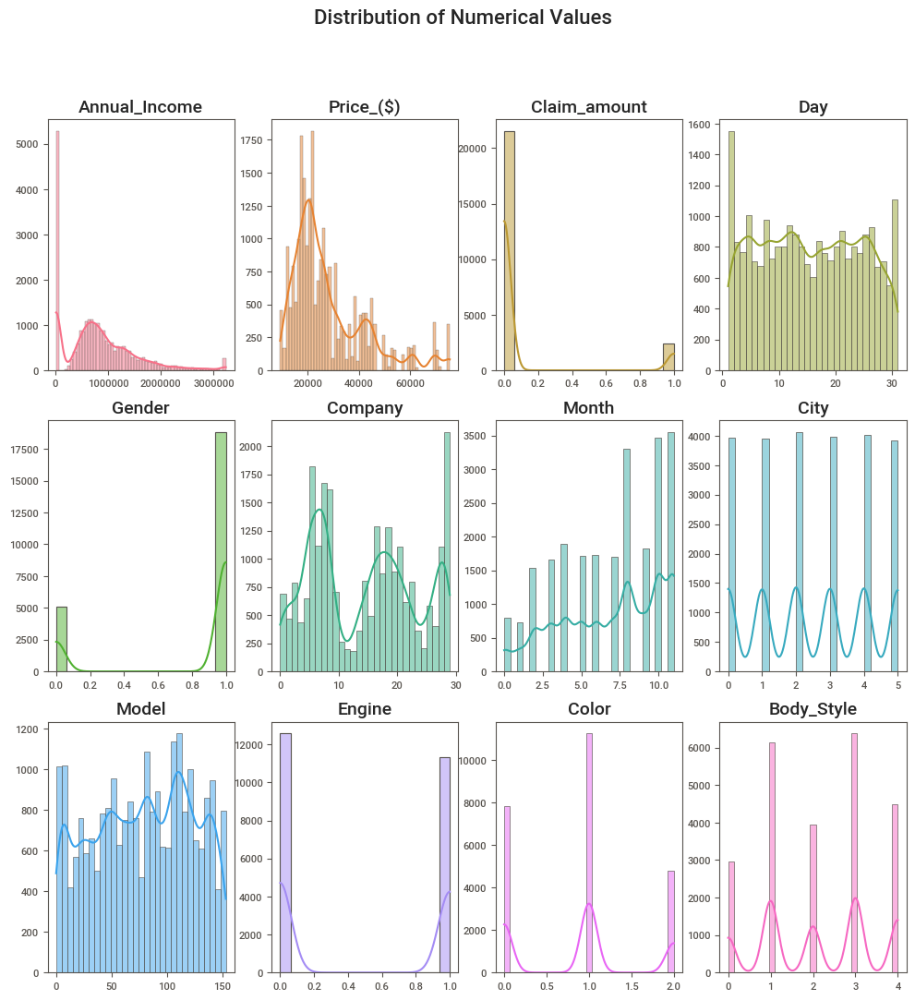

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_numerical_distribution(df):
    # List of numerical columns to plot
    num_list = ['Annual_Income', 'Price_($)', 'Claim_amount', 'Day', 'Gender', 'Company', 'Month', 'City', 'Model', 'Engine', 'Color', 'Body_Style']

    # Define a color palette
    colors = sns.color_palette('husl', len(num_list))

    # Set up the figure and title
    plt.figure(figsize=(12, 12))
    plt.tight_layout(pad=3.0)
    plt.suptitle("Distribution of Numerical Values", fontsize=16)

    # Iterate over the numerical columns and create subplots
    for idx, (col, color) in enumerate(zip(num_list, colors), start=1):
        plt.subplot(3, 4, idx)
        sns.histplot(df[col], kde=True, color=color)
        plt.title(col, fontsize=14)
        plt.xlabel('')
        plt.ylabel('')

    # Display the plots
    plt.show()

# Assuming df is your DataFrame containing the data
plot_numerical_distribution(df)


In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000.00,3,0.00,3,2022,0,2
1,1,1480000,1,7,52,0,0,19000.00,3,1900.00,2,2022,0,2
2,1,1035000,2,4,57,1,2,31500.00,2,0.00,3,2022,0,2
3,1,13500,4,27,36,1,1,14000.00,3,0.00,1,2022,0,2
4,1,1465000,3,0,141,0,2,24500.00,1,2450.00,2,2022,0,2


In [ ]:
# Apply the function to the 'claim_amount' column
def replace_non_zero_with_one(x):
    """
    Replace non-zero values with 1, leave zero values unchanged.
    """
    if x != 0:
        return 1
    else:
        return x

df['Claim_amount'] = df['Claim_amount'].apply(replace_non_zero_with_one)

In [ ]:
df.head()

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,Claim_amount,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000.00,3,0.00,3,2022,0,2
1,1,1480000,1,7,52,0,0,19000.00,3,1.00,2,2022,0,2
2,1,1035000,2,4,57,1,2,31500.00,2,0.00,3,2022,0,2
3,1,13500,4,27,36,1,1,14000.00,3,0.00,1,2022,0,2
4,1,1465000,3,0,141,0,2,24500.00,1,1.00,2,2022,0,2


In [ ]:
fixdq = FixDQ()
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,int64,0.000000,0,0.000000,1.000000,No issue
Annual_Income,int64,0.000000,9,13500.000000,3229750.000000,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,int64,0.000000,0,0.000000,27.000000,No issue
Company,int64,0.000000,0,0.000000,29.000000,No issue
Model,int64,0.000000,0,0.000000,153.000000,No issue
Engine,int64,0.000000,0,0.000000,1.000000,No issue
Color,int64,0.000000,0,0.000000,2.000000,No issue
Price_($),float64,0.000000,NA,9200.050000,75500.000000,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,int64,0.000000,0,0.000000,4.000000,No issue
Claim_amount,float64,0.000000,0,0.000000,1.000000,No issue


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Gender,int64,0.00,0,0.00,1.00,No issue
Annual_Income,int64,0.00,9,13500.00,3229750.00,Column has 816 outliers greater than upper bound (2360375.00) or lower than lower bound(-798625.00). Cap them or remove them.
Dealer_Name,int64,0.00,0,0.00,27.00,No issue
Company,int64,0.00,0,0.00,29.00,No issue
Model,int64,0.00,0,0.00,153.00,No issue
Engine,int64,0.00,0,0.00,1.00,No issue
Color,int64,0.00,0,0.00,2.00,No issue
Price_($),float64,0.00,NA,9200.05,75500.00,Column has 1449 outliers greater than upper bound (57998.50) or lower than lower bound(-5997.50). Cap them or remove them.
Body_Style,int64,0.00,0,0.00,4.00,No issue
Claim_amount,float64,0.00,0,0.00,1.00,No issue


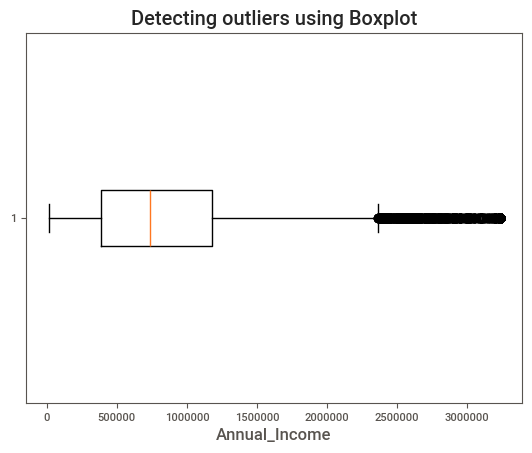

In [ ]:
detect_outliers_boxplot(df, 'Annual_Income', vert=False)

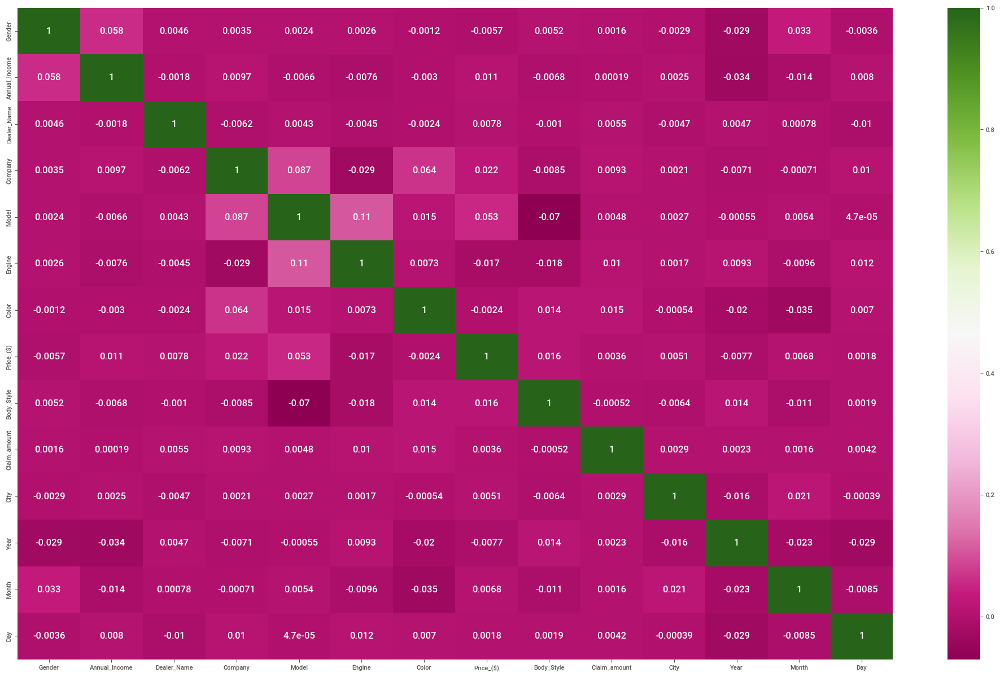

In [ ]:
%matplotlib inline
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(),annot=True,cmap="PiYG")
plt.show()

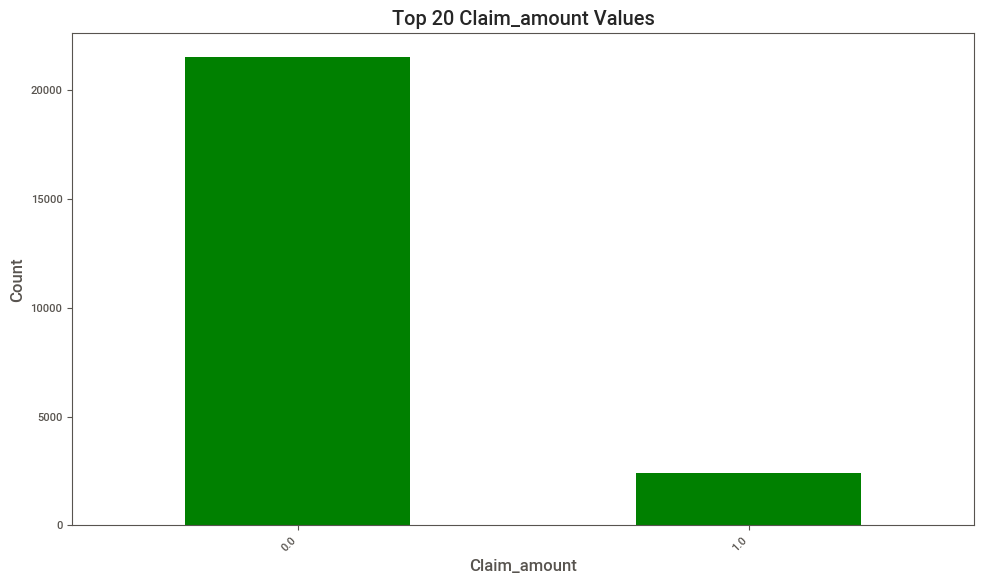

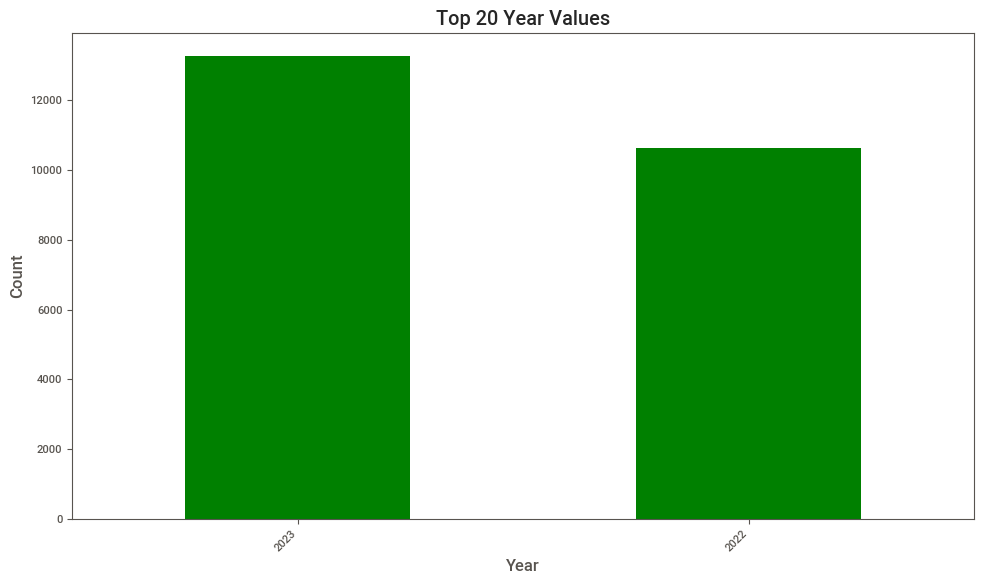

In [ ]:
plot_value_counts(df, 'Claim_amount')
plot_value_counts(df, 'Year')

In [ ]:
# Define a list of dataframes and their corresponding labels
datasets = [(df, "Dataset Exploration")]

# Loop through each dataframe and label pair
for df, label in datasets:
    print("================================={}=================================".format(label))
    explore_dataframe(df)

=================================Dataset Exploration=================================
-----------------------------------Shape Of Data-------------------------------------
(23906, 14)


-----------------------------------Top 5 Records-------------------------------------
+----+----------+-----------------+---------------+-----------+---------+----------+---------+-------------+--------------+----------------+--------+--------+---------+-------+
|    |   Gender |   Annual_Income |   Dealer_Name |   Company |   Model |   Engine |   Color |   Price_($) |   Body_Style |   Claim_amount |   City |   Year |   Month |   Day |
|----+----------+-----------------+---------------+-----------+---------+----------+---------+-------------+--------------+----------------+--------+--------+---------+-------|
|  0 |        1 |   13500         |             0 |         8 |      60 |        0 |       0 |       26000 |            3 |              0 |      3 |   2022 |       0 |     2 |
|  1 |        1 |   

### Trends

In [ ]:
df['Claim_amount'] = df['Claim_amount'].astype(int)

In [ ]:
def plot_distplots(df):
    plt.figure(figsize=(25, 20))
    plotnumber = 1

    for col in df.columns:
        if plotnumber <= 24:
            ax = plt.subplot(5, 5, plotnumber)
            sns.distplot(df[col])
            plt.xlabel(col, fontsize=15)

        plotnumber += 1

    plt.tight_layout()
    plt.show()


def plot_boxplots(df):
    plt.figure(figsize=(20, 15))
    plotnumber = 1

    for col in df.columns:
        if plotnumber <= 24:
            ax = plt.subplot(5, 5, plotnumber)
            sns.boxplot(df[col])
            plt.xlabel(col, fontsize=15)

        plotnumber += 1
    plt.tight_layout()
    plt.show()


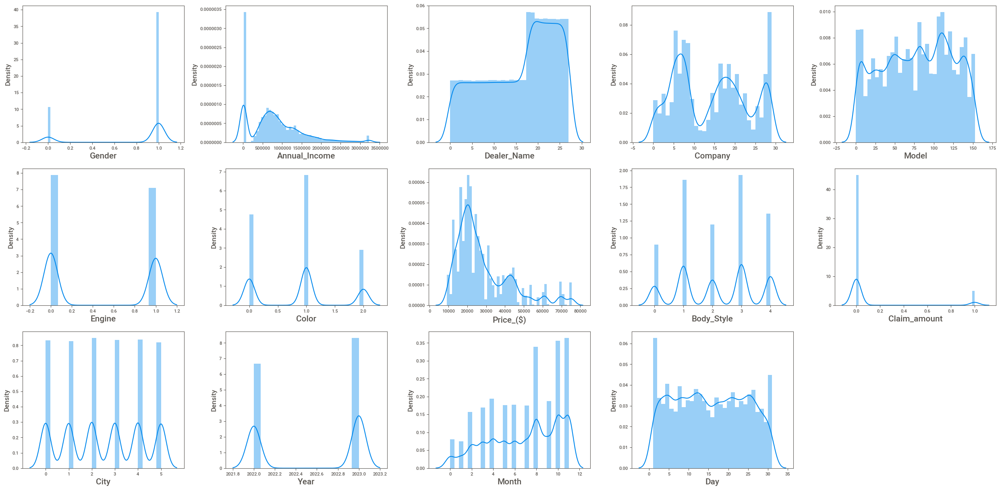

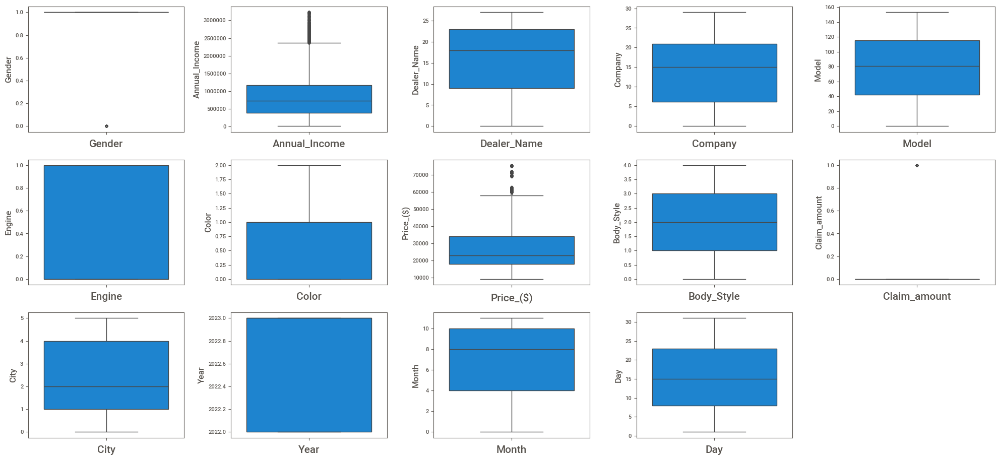

In [ ]:
plot_distplots(df)
plot_boxplots(df)

In [ ]:
df.to_csv("features.csv")

In [ ]:
df=pd.read_csv("features.csv")
columns_to_drop = ['Unnamed: 0']
df.drop(columns=columns_to_drop, axis=1, inplace=True)

## Split into training and testing

In [ ]:
y = df["Claim_amount"]
X = df.drop('Claim_amount', axis=1)

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

# Define the number of splits
n_splits = 1  # You can adjust the number of splits as needed

# Initialize StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)

# Split the data
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [ ]:
print(X_train.shape, y_train.shape)
print(X_test.shape ,  y_test.shape)

(19124, 13) (19124,)
(4782, 13) (4782,)


In [ ]:
X_train

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,City,Year,Month,Day
6336,1,900000,17,6,82,1,0,51000.00,1,3,2022,8,25
14063,1,1460000,23,16,128,1,1,17000.00,2,3,2023,4,26
20779,1,1360000,0,0,141,1,0,21000.00,1,4,2023,10,10
22606,1,262500,26,28,69,1,0,25501.00,3,5,2023,11,9
15664,0,13500,23,8,61,0,0,22000.00,1,2,2023,6,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16129,1,13500,9,6,41,1,0,18001.00,0,0,2023,6,22
23343,1,690000,12,17,148,1,1,16000.00,2,1,2023,11,23
3012,1,13500,9,25,83,0,1,51000.00,4,3,2022,5,8
5935,1,13500,19,5,109,1,1,22000.00,1,3,2022,8,19


In [ ]:
y_train

6336     1
14063    0
20779    0
22606    0
15664    0
        ..
16129    0
23343    0
3012     0
5935     0
79       0
Name: Claim_amount, Length: 19124, dtype: int64

In [ ]:
X_test

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,City,Year,Month,Day
7082,1,1355000,20,17,46,0,0,33500.00,1,5,2022,9,23
158,1,2750000,16,18,51,0,0,18000.00,1,3,2022,0,12
12133,1,13500,20,17,74,1,2,71001.00,3,4,2023,2,19
2637,1,706000,21,15,145,0,1,18000.00,1,4,2022,4,25
19132,0,500000,14,18,2,1,2,20000.00,4,5,2023,8,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7478,1,1110000,4,7,115,1,1,21000.00,0,1,2022,10,2
15389,1,500000,16,20,137,0,0,60000.00,4,2,2023,5,30
20368,1,1250000,25,6,133,0,1,22000.00,4,2,2023,10,4
583,1,480000,20,5,45,0,1,45000.00,3,0,2022,1,23


In [ ]:
y_test

7082     0
158      0
12133    1
2637     0
19132    1
        ..
7478     0
15389    0
20368    0
583      0
8187     0
Name: Claim_amount, Length: 4782, dtype: int64

## MinMax Scaling

In [ ]:
# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform X_train
X_train_scaled = scaler.fit_transform(X_train)

# Transform X_test
X_test_scaled = scaler.transform(X_test)

# Reshape y_train and y_test (assuming they are 1D arrays)
y_train_reshaped = y_train.values.reshape(-1, 1)
y_test_reshaped = y_test.values.reshape(-1, 1)

# Fit and transform y_train
y_train_scaled = scaler.fit_transform(y_train_reshaped)

# Transform y_test
y_test_scaled = scaler.transform(y_test_reshaped)

print(X_train_scaled.shape,y_train_reshaped.shape)
print(X_test_scaled.shape,y_test_scaled.shape)

(19124, 13) (19124, 1)
(4782, 13) (4782, 1)


### Modelling

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train_scaled, X_test_scaled, y_train_reshaped, y_test_scaled)

models

 97%|█████████▋| 28/29 [01:54<00:07,  7.36s/it]

[LightGBM] [Info] Number of positive: 1912, number of negative: 17212
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 788
[LightGBM] [Info] Number of data points in the train set: 19124, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.099979 -> initscore=-2.197457
[LightGBM] [Info] Start training from score -2.197457


100%|██████████| 29/29 [01:54<00:00,  3.96s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
DecisionTreeClassifier,0.81,0.51,0.51,0.81,0.20
NearestCentroid,0.51,0.50,0.50,0.60,0.05
KNeighborsClassifier,0.90,0.50,0.50,0.85,3.03
PassiveAggressiveClassifier,0.89,0.50,0.50,0.85,0.08
XGBClassifier,0.90,0.50,0.50,0.85,6.00
ExtraTreesClassifier,0.90,0.50,0.50,0.85,1.98
AdaBoostClassifier,0.90,0.50,0.50,0.85,1.38
SVC,0.90,0.50,0.50,0.85,47.88
SGDClassifier,0.90,0.50,0.50,0.85,0.14


### Logistic Regression

In [ ]:
# Initialize the Logistic Regression model
logistic_regression = LogisticRegression(random_state=42)

# Train the model on the scaled training data
logistic_regression.fit(X_train_scaled, y_train_reshaped)

# Predict on the scaled testing data
y_pred_lr = logistic_regression.predict(X_test_scaled)


In [ ]:
def evaluate_classification_model(y_true, y_pred):
    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='PiYG', cbar=False, xticklabels=['Claim', 'Not_Claim'], yticklabels=['Claim', 'Not_Claim'])
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Calculate the validation metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

def evaluate_model(y_true, y_pred_proba):
    # Calculate ROC AUC
    roc_auc = roc_auc_score(y_true, y_pred_proba)
    fpr, tpr, _ = roc_curve(y_true, y_pred_proba)

    # Calculate Precision-Recall curve
    precision, recall, _ = precision_recall_curve(y_true, y_pred_proba)
    pr_auc = average_precision_score(y_true, y_pred_proba)

    # Plot ROC AUC curve
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')

    # Plot Precision-Recall curve
    plt.subplot(1, 2, 2)
    plt.plot(recall, precision, color='red', lw=2, label='Precision-Recall curve (AP = %0.2f)' % pr_auc)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc='lower left')

    plt.tight_layout()
    plt.show()


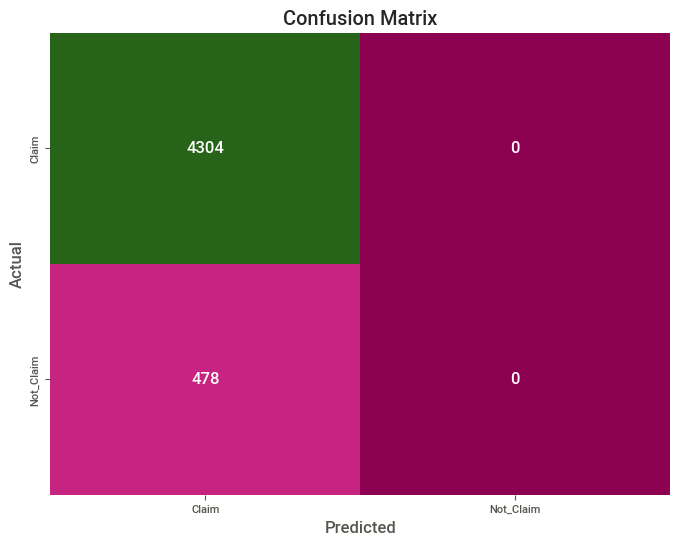

Accuracy: 0.9000418235048097
Precision: 0.810075284057863
Recall: 0.9000418235048097
F1 Score: 0.8526920555502314


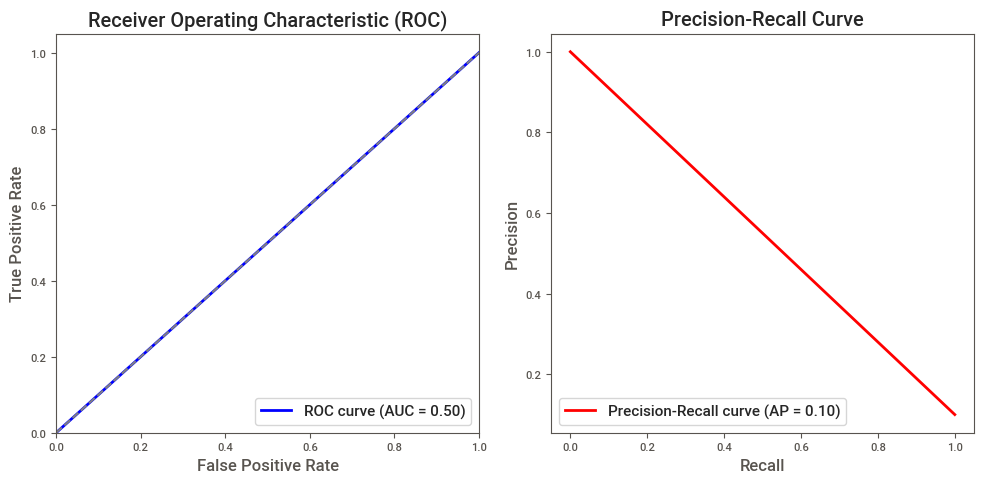

In [ ]:
evaluate_classification_model(y_test_scaled, y_pred_lr)
evaluate_model(y_test_scaled, y_pred_lr)

## Using Data Augumentation

In [ ]:
# Apply SMOTE
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

print("Shape of X_train before SMOTE:", X_train.shape)
print("Shape of X_train after SMOTE:", X_train_smote.shape)

Shape of X_train before SMOTE: (19124, 13)
Shape of X_train after SMOTE: (34424, 13)


In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train_scaled, X_test_scaled, y_train_reshaped, y_test_scaled)

models

 97%|█████████▋| 28/29 [01:47<00:07,  7.32s/it]

[LightGBM] [Info] Number of positive: 1912, number of negative: 17212
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 788
[LightGBM] [Info] Number of data points in the train set: 19124, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.099979 -> initscore=-2.197457
[LightGBM] [Info] Start training from score -2.197457


100%|██████████| 29/29 [01:47<00:00,  3.71s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
DecisionTreeClassifier,0.81,0.51,0.51,0.81,0.19
NearestCentroid,0.51,0.50,0.50,0.60,0.05
KNeighborsClassifier,0.90,0.50,0.50,0.85,2.12
PassiveAggressiveClassifier,0.89,0.50,0.50,0.85,0.06
XGBClassifier,0.90,0.50,0.50,0.85,3.19
ExtraTreesClassifier,0.90,0.50,0.50,0.85,2.00
AdaBoostClassifier,0.90,0.50,0.50,0.85,0.92
SVC,0.90,0.50,0.50,0.85,49.02
SGDClassifier,0.90,0.50,0.50,0.85,0.19


In [ ]:
# Initialize the Logistic Regression model
logistic_regression = LogisticRegression(random_state=42)

# Train the model on the scaled training data
logistic_regression.fit(X_train_smote, y_train_smote)

# Predict on the scaled testing data
y_pred_lr = logistic_regression.predict(X_test_scaled)

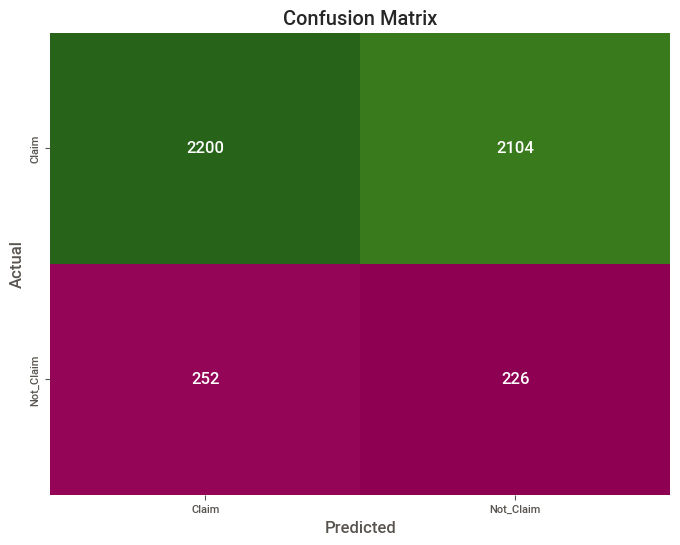

Accuracy: 0.507319113341698
Precision: 0.8172371175858575
Recall: 0.507319113341698
F1 Score: 0.6022630206529568


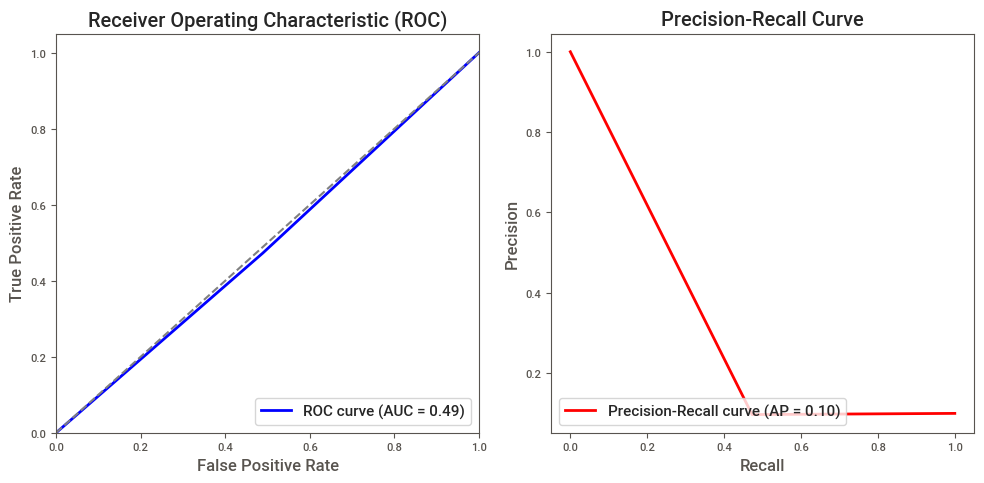

In [ ]:
evaluate_classification_model(y_test_scaled, y_pred_lr)
evaluate_model(y_test_scaled, y_pred_lr)

# Regression

In [ ]:
df=pd.read_csv('/content/features.csv')
df.head(10)
columns_to_drop = ['Unnamed: 0']
df.drop(columns=columns_to_drop, axis=1, inplace=True)

In [ ]:
# Assuming 'df' is your dataframe
y = df["Claim_amount"]
X = df.drop('Claim_amount', axis=1)

In [ ]:
# Calculate the index to split the data
split_index = int(0.8 * len(df))

# Split the data
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]


## MinMax Scaling
# Initialize the scaler
scaler = MinMaxScaler()

# Fit and transform X_train
X_train_scaled = scaler.fit_transform(X_train)

# Transform X_test
X_test_scaled = scaler.transform(X_test)

# Reshape y_train and y_test (assuming they are 1D arrays)
y_train_reshaped = y_train.values.reshape(-1, 1)
y_test_reshaped = y_test.values.reshape(-1, 1)

# Fit and transform y_train
y_train_scaled = scaler.fit_transform(y_train_reshaped)

# Transform y_test
y_test_scaled = scaler.transform(y_test_reshaped)

print(X_train_scaled.shape,y_train_reshaped.shape)
print(X_test_scaled.shape,y_test_scaled.shape)

(19124, 13) (19124, 1)
(4782, 13) (4782, 1)


In [ ]:
X_train

,Gender,Annual_Income,Dealer_Name,Company,Model,Engine,Color,Price_($),Body_Style,City,Year,Month,Day
0,1,13500,0,8,60,0,0,26000.00,3,3,2022,0,2
1,1,1480000,1,7,52,0,0,19000.00,3,2,2022,0,2
2,1,1035000,2,4,57,1,2,31500.00,2,3,2022,0,2
3,1,13500,4,27,36,1,1,14000.00,3,1,2022,0,2
4,1,1465000,3,0,141,0,2,24500.00,1,2,2022,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19119,1,1510000,11,17,46,0,0,26000.00,1,5,2023,8,29
19120,1,1055000,4,20,137,1,2,34500.00,4,3,2023,8,29
19121,1,13500,3,28,69,0,1,20001.00,3,4,2023,8,29
19122,1,1325000,20,0,141,0,2,29500.00,1,5,2023,8,29


In [ ]:
from lazypredict.Supervised import LazyRegressor
reg = LazyRegressor(verbose=0, ignore_warnings=False, custom_metric=None)
models, predictions = reg.fit(X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled)

models

 21%|██▏       | 9/42 [00:06<00:39,  1.20s/it]

GammaRegressor model failed to execute
Some value(s) of y are out of the valid range of the loss 'HalfGammaLoss'.


 36%|███▌      | 15/42 [05:13<09:14, 20.53s/it]

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Logistic Regression
log_reg = LogisticRegression()
log_reg.fit(X_train_scaled, y_train)

# Predictions
y_pred = log_reg.predict(X_test_scaled)
y_pred_proba = log_reg.predict_proba(X_test_scaled)[:, 1]


# Evaluate the regression model
def evaluate_regression_model(y_true, y_pred):
    # Calculate the validation metrics
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print("Mean Absolute Error (MAE):", mae)
    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("R-squared (R2):", r2)

    # Plot predicted vs actual values
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=y_true, y=y_pred, alpha=0.6, color='b')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], '--r', linewidth=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted')
    plt.show()

evaluate_regression_model(y_test, y_pred)